# Practical Machine Learning for Physicists
## Week 6 Exercise 
## Deadline Monday 30th November at 12pm (Noon)

### 0 Introduction

### 1 Designing a neural network to predict future predictions ($t_{0} + 20\delta t$) with initial conditions $z_{0} = [\frac{\pi}{4},0 ,\frac{\pi}{4},0]$
#### 1.1 Designing the neural network
#### 1.2 Predicting future positions

### 2 Testing stability of the neural network
#### 2.1 Plotting predicted positions vs actual solved positions

### 3 How far in the future can the network predict?
#### 3.1 plot of deviation from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$

### 4 Changing initial conditions to $z_{0} = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$
#### 4.1 Designing and training a neural network to predict future positions ($t_{0} + 20\delta t$)
#### 4.2 plotting predicted positions vs actual positions
#### 4.3 plot of deviation from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$

### 5 Only training neural network on coordinates of $m_{2}$
#### 5.1 initial conditions $z_{0} = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$
##### 5.1.1 Designing and training a neural network to predict future positions ($t_{0} + 20\delta t$)
##### 5.1.2 plotting predicted positions vs actual positions
##### 5.1.3 plot of deviation from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$
#### 5.2 initial conditions $z_{0} = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$
##### 5.2.1 Designing and training a neural network to predict future positions ($t_{0} + 20\delta t$)
##### 5.2.2 plotting predicted positions vs actual positions
##### 5.2.3 plot of deviation from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$

In this notebook you will be trying to predict a system using incomplete information. We will set up the equations of motions for a simple double pendulum (or should that be a double simple pendulum. Then we will see if a machine learning technique can predict the future position of the lower mass, using only the lower mass positions.

### Kinematics of the double pendulum
Let's specify our problem in terms of the following, with the origin at the pivot point of the top pendulum. This is just background for the machine learning tasks at the bottom of the notebook.

#### Positions
$$x_1 = L_1 \sin \theta_1$$
$$y_1 = -L_1 \cos \theta_1$$
$$x_2 = x_1 + L_2 \sin \theta_2$$
$$y_2 = y_1 - L_2 \cos \theta_2$$

#### Velocities
$$\dot{x}_1 = \dot{\theta_1} L_1 \cos \theta_1$$
$$\dot{y_1} =  \dot{\theta_1} L_1 \sin \theta_1$$
$$\dot{x_2} = \dot{x_1} + \dot{\theta_2} L_2 \cos \theta_2$$
$$\dot{y_2} = \dot{y_1} + \dot{\theta_2} L_2 \sin \theta_2$$


#### Accelerations

$$\ddot{x}_1 = -\dot{\theta_1}^2 L_1 \sin \theta_1 + \ddot{\theta_1} L_1 \cos \theta_1$$
$$\ddot{y_1} =  \dot{\theta_1}^2 L_1 \cos \theta_1 + \ddot{\theta_1} L_1 \sin \theta_1$$
$$\ddot{x_2} = \ddot{x_1} - \dot{\theta_2}^2 L_2 \sin \theta_2 + \ddot{\theta_2} L_2 \cos \theta_2$$
$$\ddot{y_2} = \ddot{y_1} + \dot{\theta_2}^2 L_2 \cos \theta_2 + \ddot{\theta_2} L_2 \sin \theta_2$$

#### Energies
Let $v_1^2 = \dot{x_1}^2 +\dot{y_1}^2$ and $v_2^2 = \dot{x_2}^2 +\dot{y_2}^2$ then the kinetic energies $T_1$ and $T_2$ are
$$ T_1 = \frac{1}{2}m_1 v_1^2 = \frac{1}{2}m_1 L_1^2 \dot{\theta_1}^2 $$
$$ T_2 = \frac{1}{2}m_2 v_2^2 = \frac{1}{2}m_2 \left( L_1^2 \dot{\theta_1}^2 + L_2^2 \dot{\theta_2}^2 + 2L_1 L_2 \cos(\theta_1-\theta_2) \dot{\theta_1} \dot{\theta_2} \right) $$

The potential enrgies are
$$V_1 = m_1 g y_1 = - m_1 g L_1 \cos \theta_1$$
$$V_2 = m_2 g y_2 = -m_2 g ( L_1 \cos \theta_1 + L_2 \cos \theta_2)$$

#### Langrangian
Now we form the Lagrangian $L=T-V=T_1+T_2 -V_1 -V_2$ and use the Euler-Lagrange equations:
$$\frac{\partial L}{\partial \theta_1} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_1}}$$
$$\frac{\partial L}{\partial \theta_2} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_2}}$$

Applying these gives
$$-(m_1+m_2) g L_1 \sin \theta_1 = (m_1+m_2) L_1^2 \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_2}^2 +  m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_2} $$
and
$$ -m_2 g L_2 \sin \theta_2 = m_2 L_2 \ddot{\theta_2} + m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_1}^2 $$ 


#### Equations of motions
$$ \omega_1 = \dot{\theta_1}$$  

$$ \omega_2 = \dot{\theta_2}$$ 
$$ \ddot\theta_1 = \frac{1}{L_1\xi}\left[L_1m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_1^2 + L_2m_2\sin(\theta_1-\theta_2)\omega_2^2 - m_2g\cos(\theta_1-\theta_2)\sin(\theta_2) + (m_1+m_2)g\sin(\theta_1) \right] $$
$$ \ddot\theta_2 = \frac{1}{L_2\xi}\left[L_2m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_2^2 + L_1(m_1+m_2)\sin(\theta_1-\theta_2)\omega_1^2+(m_1+m_2)g\sin(\theta_1)\cos(\theta_1-\theta_2) - (m_1+m_2)g\sin(\theta_2) \right] $$
where 
$$\xi \equiv \cos^2(\theta_1-\theta_2)m_2-m_1-m_2$$


In [1]:
%matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt 
from scipy.integrate import solve_ivp

import matplotlib.style #Some style nonsense
import matplotlib as mpl #Some more style nonsense

#Set default figure size
#mpl.rcParams['figure.figsize'] = [12.0, 8.0] #Inches... of course it is inches
#mpl.rcParams["legend.frameon"] = False
#mpl.rcParams['figure.dpi']=200 # dots per inch

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

In [2]:
def rhs(t, z, L1, L2, m1, m2, g):
    """
    Returns the right-hand side of the ordinary differential equation describing the double pendulem
    """
    theta1, w1, theta2, w2 = z    #The four components
    cos12 = np.cos(theta1 - theta2)
    sin12 = np.sin(theta1 - theta2)
    sin1 = np.sin(theta1)
    sin2 = np.sin(theta2)
    xi = cos12**2*m2 - m1 - m2
    w1dot = ( L1*m2*cos12*sin12*w1**2 + L2*m2*sin12*w2**2
            - m2*g*cos12*sin2      + (m1 + m2)*g*sin1)/(L1*xi)
    w2dot = -( L2*m2*cos12*sin12*w2**2 + L1*(m1 + m2)*sin12*w1**2
            + (m1 + m2)*g*sin1*cos12  - (m1 + m2)*g*sin2 )/(L2*xi)
    return w1, w1dot, w2, w2dot   #Return the w's and the wdot's


def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    """ Transforms theta and omega to cartesian coordinates
    and velocities x1, y1, x2, y2, vx1, vy1, vx2, vy2
    """
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1*np.cos(theta1)*w1
    vy1 = L1*np.sin(theta1)*w1
    vx2 = vx1 + L2*np.cos(theta2)*w2
    vy2 = vy1 + L2*np.sin(theta2)*w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2
    

In [3]:
# Set up the initial conditions. Here we have lengths and masses
L1, L2 = 1., 1.
m1, m2 = 3., 1.
g = 9.81     # [m/s^2]. Gravitational acceleration

#Starting angles
z0=[np.pi/4,0,np.pi/4,0]
#z0=[0.1,0,0.1,0]

#Time ranges
tmax, dt = 50, 0.1
t = np.arange(0, tmax+dt, dt)

In [4]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


<IPython.core.display.Javascript object>


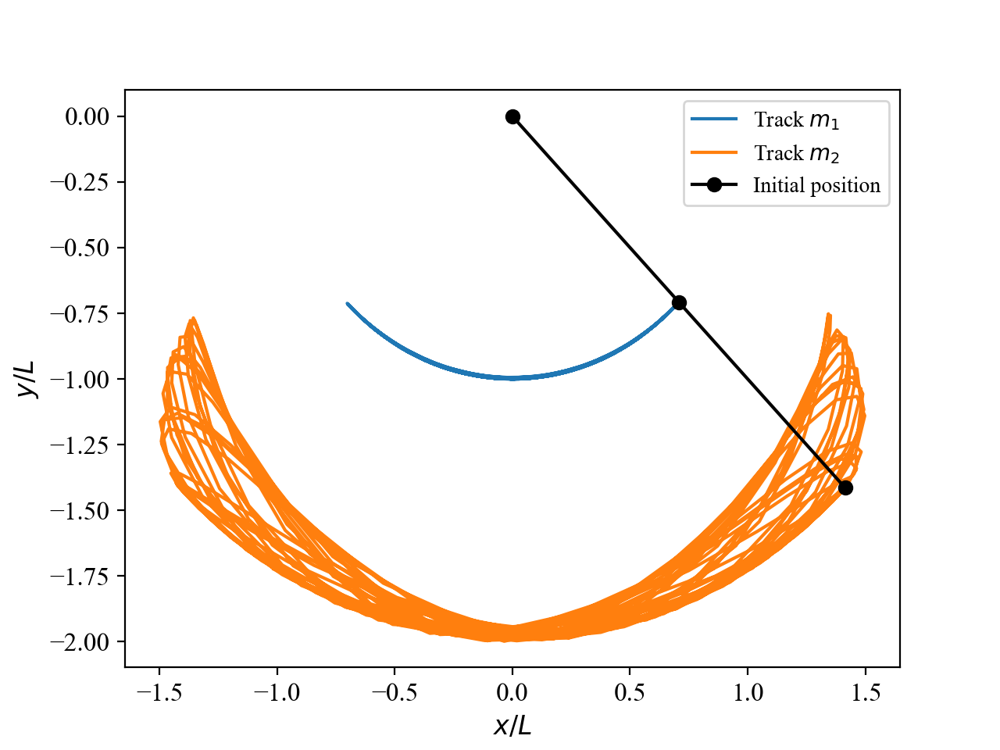

In [5]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, '-', label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

# Exercises: Predicting Chaos
1. Design and train a recurrent neural network (of your choice) to predict the future positions, where future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$. 
2. How stable is your network to variations in initial conditions? Make a plot of $x$ and $y$ vs time to show the network prediction in comparison to the solution from solve_ivp
3. How far into the future can a network predict? Make a plot showing how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$  (e.g. for each extrapolation time, train a new version of the network and then plot the performance)
4. Repeat steps 1-3 for the initial conditions $z_0=[\pi/2,0,\pi/2,0]$ which give a much more complex path.
5. Repeat steps 1-4 but only train your neural network on the cartesian coordinates of the mass $m_2$ (i.e without showing your neural network the positions of the mass $m_1$)



In [6]:
import tensorflow as tf
from tensorflow import keras

### 1 Designing and training a neural network to predict future positions ($t = t_{0} + 20\delta t $) using initial conditions $z_{0} = [\frac{\pi}{4}, 0 , \frac{\pi}{4}, 0]$

### 1.1 Designing the neural network

In [7]:
def create_model():
    '''Function which creates a neural network model of 2 layers
    Input: none
    Returns: the model'''

    model = keras.models.Sequential()
    
    #The input shape is None, 4 because there are 4 variables in z_0
    model.add(keras.layers.LSTM(40, input_shape = (None, 4), return_sequences = False))

    model.add(keras.layers.Dense(4, activation = 'linear'))

    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    
    return model

In [8]:
windowsize = 10
offset = 20

def shapeArray(x, windowsize, offset):
    '''Function which shapes the input array into input output pairs based on the specified window size and 
    offset
    Inputs:
    x: array of inputs
    windowsize: integer of size of window
    offset: integer of size of offset
    
    Returns:
    xInput: array of shaped input
    xLabel: array of shaped input labels'''
    
    xInput = np.array([x[i : i + windowsize] for i in range(len(x) - (windowsize + offset) + 1)])
    
    xLabel = np.array([x[i + windowsize : i + windowsize + offset] 
                       for i in range(len(x) - (windowsize + offset) + 1)])
    
    return xInput, xLabel

In [9]:
def target(time, windowsize, offset):
    '''Function which works out the cordinates of the two masses after a certain time
    Inputs:
    time: array of time values
    windowsize: integer of size of window
    offset: integer of size of offset
    
    Returns:
    Input: the actual positions
    Return: the predicted positions'''
    
    cartesian = solve_ivp(rhs, (0, max(time)), z0, t_eval = time, args = (L1, L2, m1, m2, g))
    
    z = ret.y
    
    theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
    
    x1, y1, x2, y2, vx_1, vy_2, vx_2, vy_2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)
    
    x1_Input, x1_Output = shapeArray(x1, windowsize, offset)
    x2_Input, x2_Output = shapeArray(x2, windowsize, offset)
    y1_Input, y1_Output = shapeArray(y1, windowsize, offset)
    y2_Input, y2_Output = shapeArray(y2, windowsize, offset)
    
    x1_in = x1_Input.reshape(x1_Input.shape[0], x1_Input.shape[1], 1)
    x2_in = x2_Input.reshape(x2_Input.shape[0], x2_Input.shape[1], 1)
    y1_in = y1_Input.reshape(y1_Input.shape[0], y1_Input.shape[1], 1)
    y2_in = y2_Input.reshape(y2_Input.shape[0], y2_Input.shape[1], 1)
    
    x1_ret = x1_Output[:, -1].reshape(x1_Output.shape[0], 1)
    x2_ret = x2_Output[:, -1].reshape(x2_Output.shape[0], 1)
    y1_ret = y1_Output[:, -1].reshape(y1_Output.shape[0], 1)
    y2_ret = y2_Output[:, -1].reshape(y2_Output.shape[0], 1)
    
    Input = np.array([x1_in, y1_in, x2_in, y2_in]).reshape(x1_Input.shape[0], x1_Input.shape[1], 4)
    Return = np.array([x1_ret, y1_ret, x2_ret, y2_ret]).reshape(y2_Output.shape[0], 4)
    
    return Input, Return

<IPython.core.display.Javascript object>


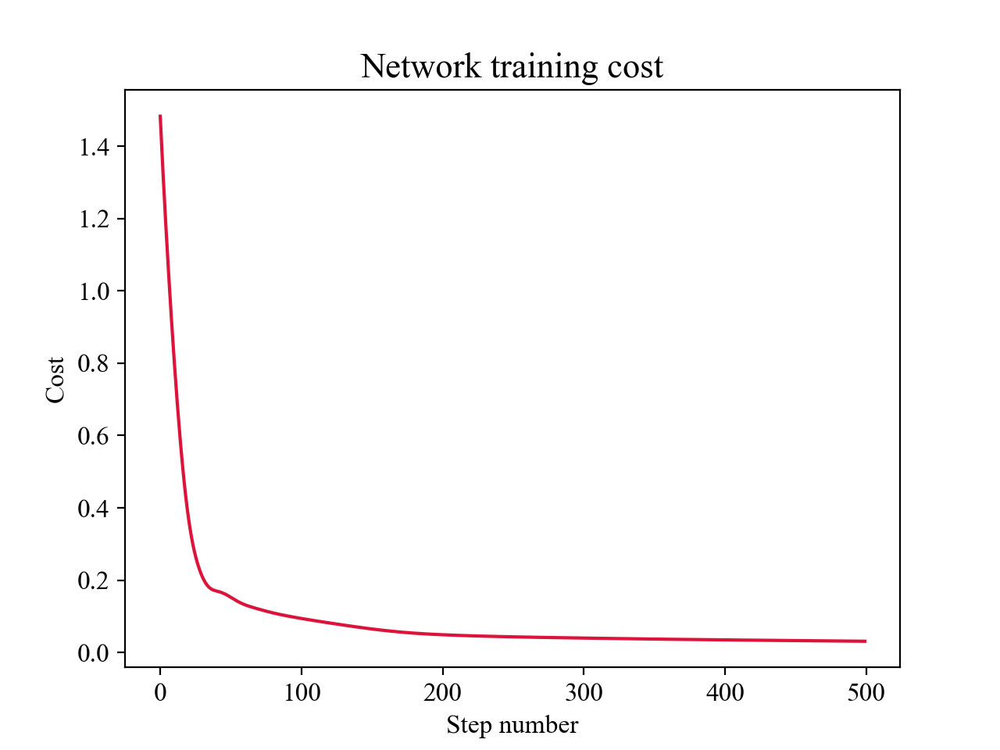

The final cost of the network is 0.031107360497117043


In [10]:
#Training the network

model = create_model()

steps = 500

cost = np.zeros(steps)

for i in range(steps):
    
    t = np.arange(0, tmax + dt, dt)
    
    Input, Return = target(t, windowsize, offset)
    
    cost[i] = model.train_on_batch(Input, Return)
    
plt.figure(2)

plt.plot(np.arange(steps), cost, color = 'crimson',)

plt.title('Network training cost')
plt.xlabel('Step number')
plt.ylabel('Cost')

print('The final cost of the network is', cost[-1])

### 1.2 Predicting future positions

<IPython.core.display.Javascript object>


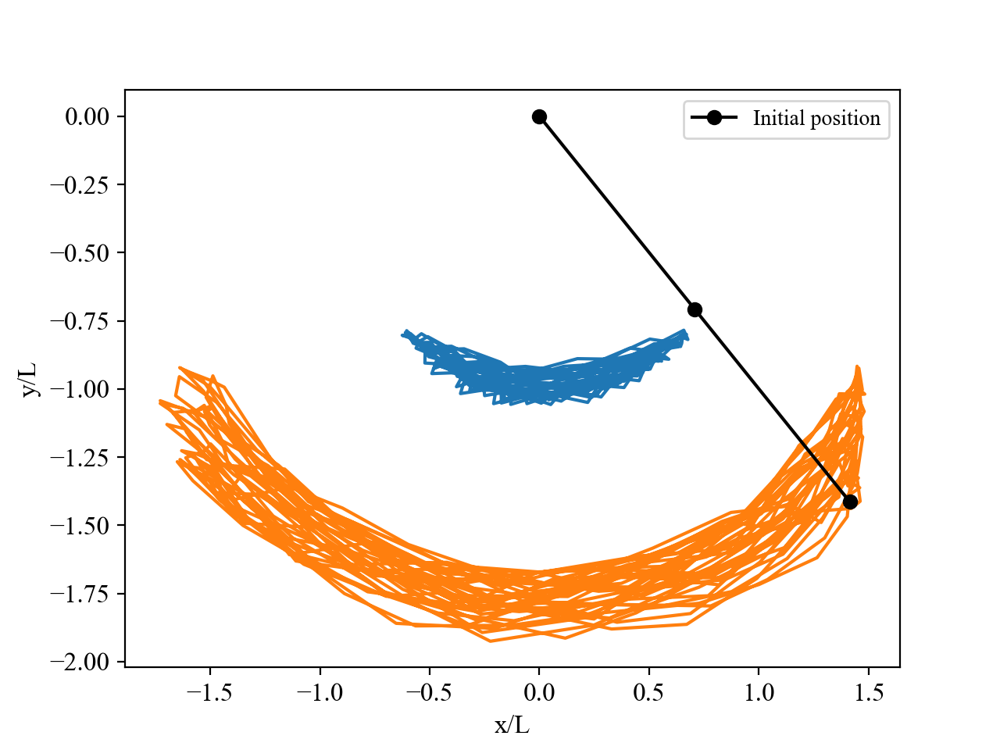

Text(0, 0.5, 'y/L')

In [11]:
t_test = np.arange(0, 50 + 0.1, 0.1) #The time values

Input, Return = target(t_test, windowsize, offset)

Input = Input.reshape(Input.shape[0], Input.shape[1], 4)

prediction = model.predict_on_batch(Input).reshape(4, len(t_test) + 1 - windowsize - offset)

#All the predicted position arrays

x1_ret = prediction[0]
y1_ret = prediction[1]
x2_ret = prediction[2]
y2_ret = prediction[3]

plt.figure(3)

plt.plot(x1_ret, y1_ret)
plt.plot(x2_ret, y2_ret)
plt.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label = "Initial position", c = 'k')
plt.legend(loc='best')
plt.xlabel('x/L')
plt.ylabel('y/L')

In [12]:
print(x1.shape)

(501,)


### 2 Testing stabilty of network and plotting x and y vs time and comparing to solve_ivp solution

In [13]:
solutions = to_cartesian(theta1, w1, theta2, w2, L1, L2)

fig, axs = plt.subplots(2, 2)
plt.tight_layout()
axs[0, 0].plot(t_test[:300], solutions[0][:300], color='crimson', label = 'Solve_IVP solution')
axs[0, 0].plot(t_test[windowsize + offset - 1:300], prediction[0][:300 - (windowsize + offset - 1)], 
         color ='turquoise', label = 'Network solution')
axs[0, 0].set_title("m1 x position")

axs[0, 1].plot(t_test[:300], solutions[1][:300], color='crimson', label = 'Solve_IVP solution')
axs[0, 1].plot(t_test[windowsize + offset - 1:300], prediction[1][:300 - (windowsize + offset - 1)], 
         color ='turquoise', label = 'Network solution')
axs[0, 1].set_title("m1 y position")

axs[1, 0].plot(t_test[:300], solutions[2][:300], color='crimson', label = 'Solve_IVP solution')
axs[1, 0].plot(t_test[windowsize + offset - 1:300], prediction[2][:300 - (windowsize + offset - 1)], 
         color ='turquoise', label = 'Network solution')
axs[1, 0].set_title("m2 x position")

axs[1, 1].plot(t_test[:300], solutions[3][:300], color='crimson', label = 'Solve_IVP solution')
axs[1, 1].plot(t_test[windowsize + offset - 1:300], prediction[3][:300 - (windowsize + offset - 1)], 
         color ='turquoise', label = 'Network solution')
axs[1, 1].set_title("m2 y position")

for ax in axs.flat:
    ax.set(xlabel='Time/s', ylabel='x position')


<IPython.core.display.Javascript object>


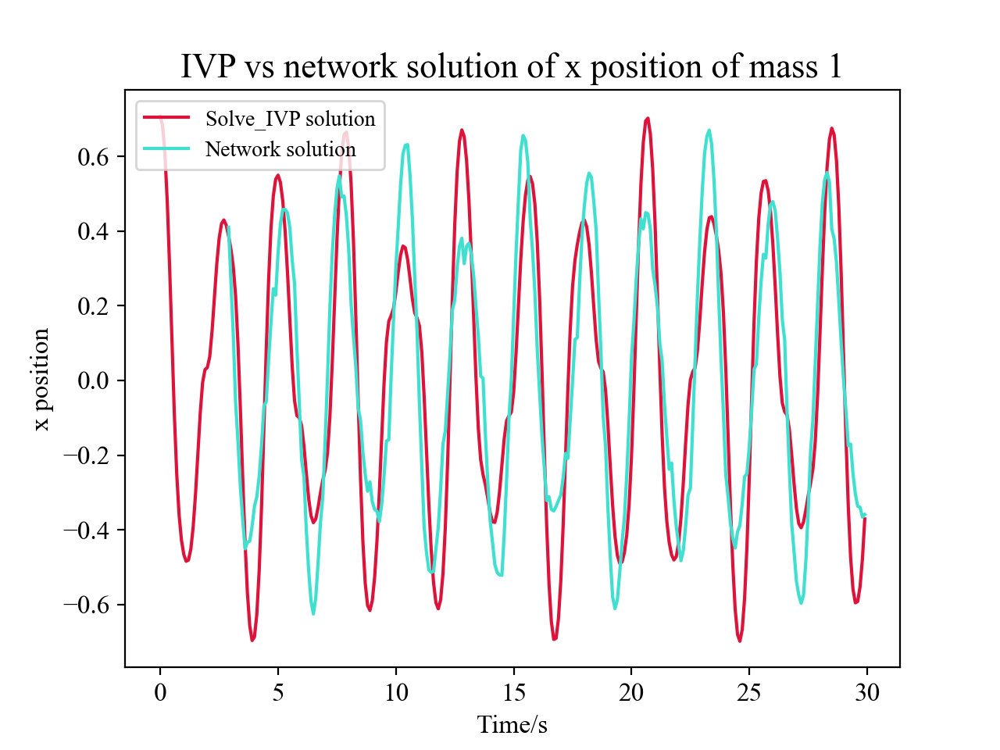

Text(0.5, 1.0, 'IVP vs network solution of x position of mass 1')

In [14]:
plt.figure(4)

plt.plot(t_test[:300], solutions[0][:300], color='crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[0][:300 - (windowsize + offset - 1)], 
         color ='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('x position')
plt.legend(loc='best')
plt.title('IVP vs network solution of x position of mass 1')

<IPython.core.display.Javascript object>


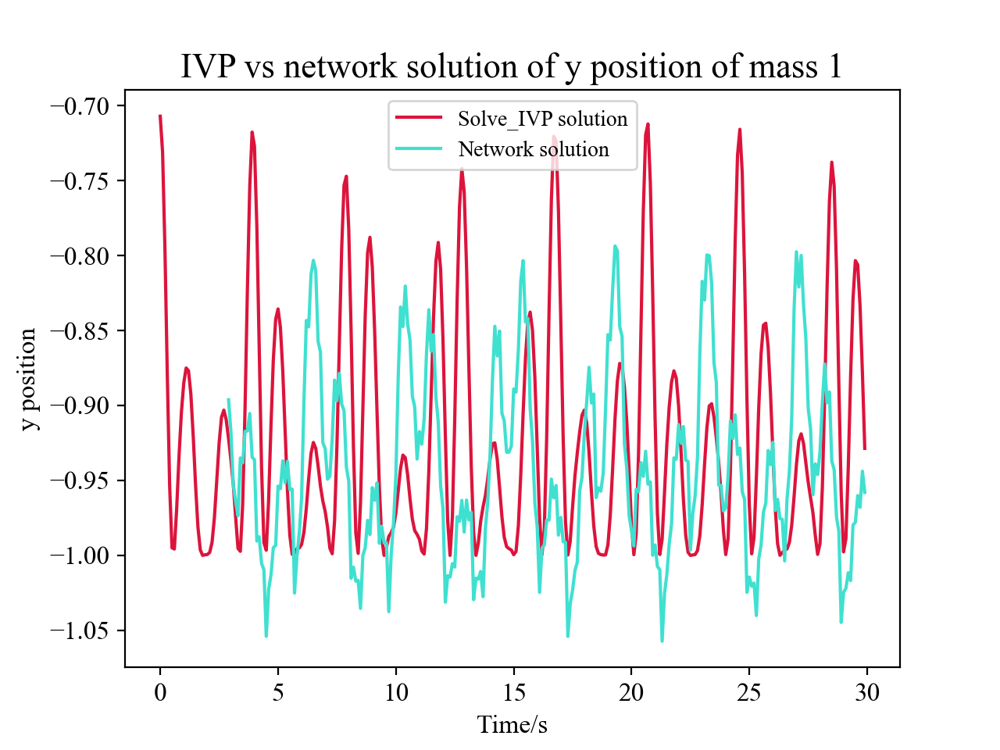

Text(0.5, 1.0, 'IVP vs network solution of y position of mass 1')

In [15]:
plt.figure(5)

plt.plot(t_test[:300], solutions[1][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[1][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('y position')
plt.legend(loc='best')
plt.title('IVP vs network solution of y position of mass 1')

<IPython.core.display.Javascript object>


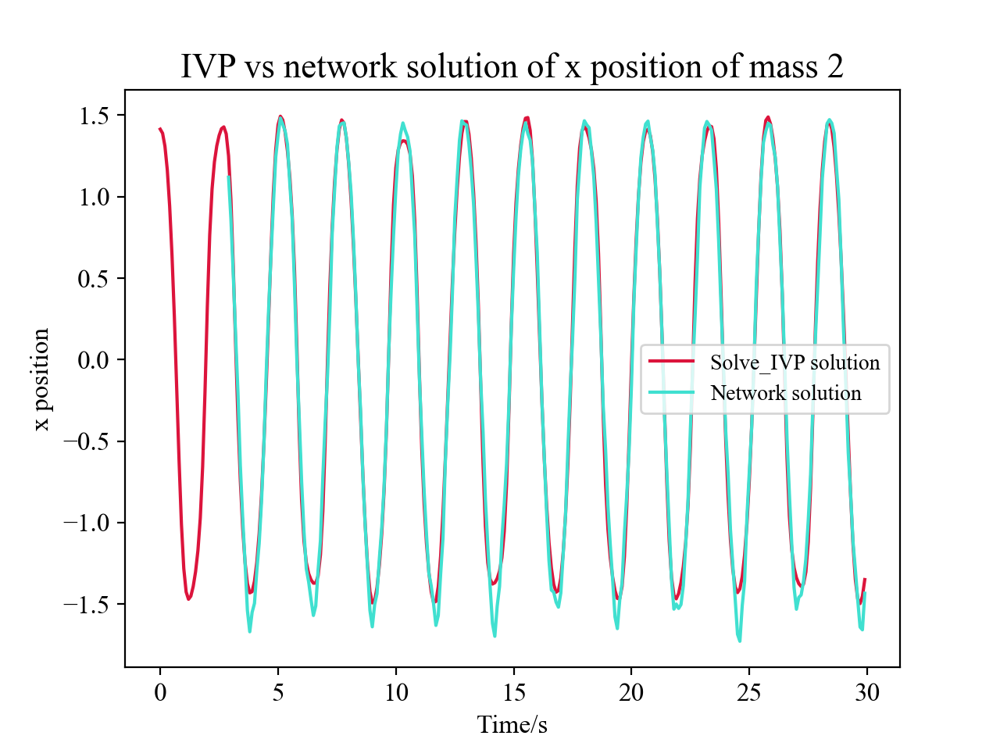

Text(0.5, 1.0, 'IVP vs network solution of x position of mass 2')

In [16]:
plt.figure(6)

plt.plot(t_test[:300], solutions[2][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[2][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('x position')
plt.legend(loc='best')
plt.title('IVP vs network solution of x position of mass 2')

<IPython.core.display.Javascript object>


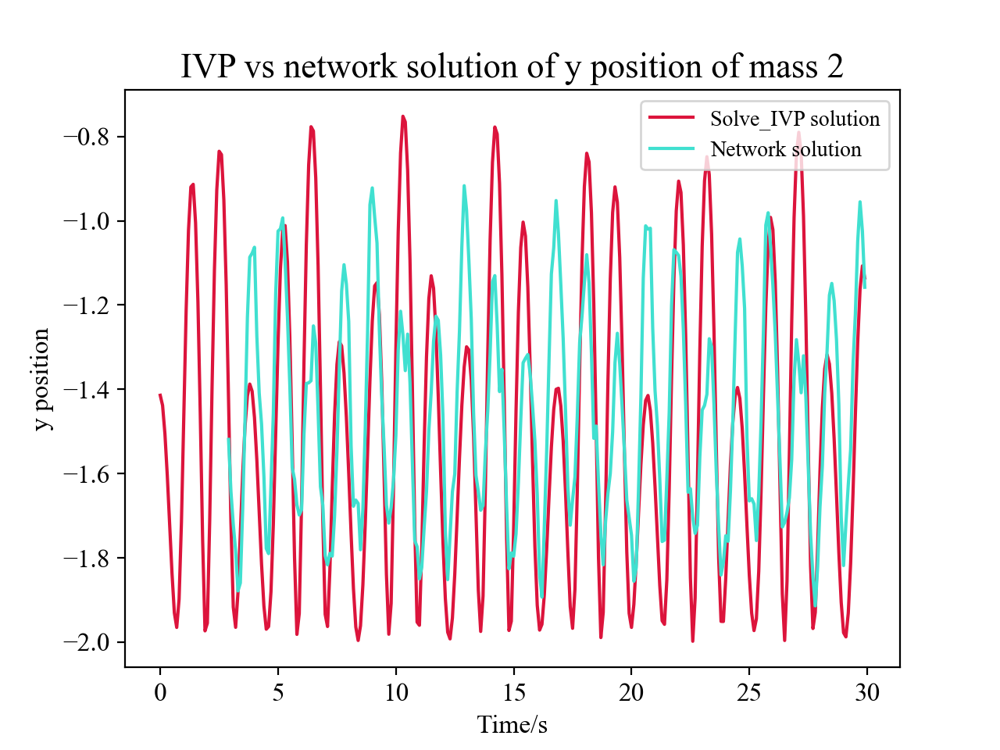

Text(0.5, 1.0, 'IVP vs network solution of y position of mass 2')

In [17]:
plt.figure(7)

plt.plot(t_test[:300], solutions[3][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[3][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('y position')
plt.legend(loc='best')
plt.title('IVP vs network solution of y position of mass 2')

The neural network is very good at predicting the x positions of both masses, as seen by the plots showing little deviation between the 2, and both graphs following closely. For the y position, the network is able to get the frequency of oscilattions correct, by the amplitudes are not that great, but the general shape is achieved.

### 3 How far in the future can the network predict? Making a plot of deviation between predicted position & actual position for ($t = t_{0} + 20\delta t $) to ($t = t_{0} + 100\delta t $) training a new version each time

In [18]:
def deviation(t, windowsize, offset, model):
    '''Function which calculates the deviation of the model by finding the difference between the actual and
    predicted position
    
    Inputs:
    t: array of time values
    windowsize:integer of size of window
    offset: integer of size of offset
    model: the neural network
    
    Returns:
    dev: array of deviation (difference between actual and predicted position)
    '''
    
    Input, Return = target(t, windowsize, offset)
    
    prediction = model.predict_on_batch(Input).reshape(4, len(t) + 1 - windowsize - offset)
    
    #Empty array of deviation
    dev = []
    
    for i in range(4):
        
        dev.append(np.sum(np.abs(prediction[i] - solutions[i][windowsize + offset - 1:])))
        
    return dev

In [19]:
new_steps = np.arange(20, 100 + 10, 10)

#Empty arrays for all 4 positions
devx1, devx2, devy1, devy2 = [], [], [], []

#Loop through all time values
for steps in new_steps:
    
    offset = steps
    
    model = create_model()
    
    steps = 300
    
    for i in range(steps):
        
        Input, Return = target(t, windowsize, offset)
        
        model.train_on_batch(Input, Return)
        
    devx1.append(deviation(t, windowsize, offset, model)[0])
    devy1.append(deviation(t, windowsize, offset, model)[1])
    devx2.append(deviation(t, windowsize, offset, model)[2])
    devy2.append(deviation(t, windowsize, offset, model)[3])

<IPython.core.display.Javascript object>


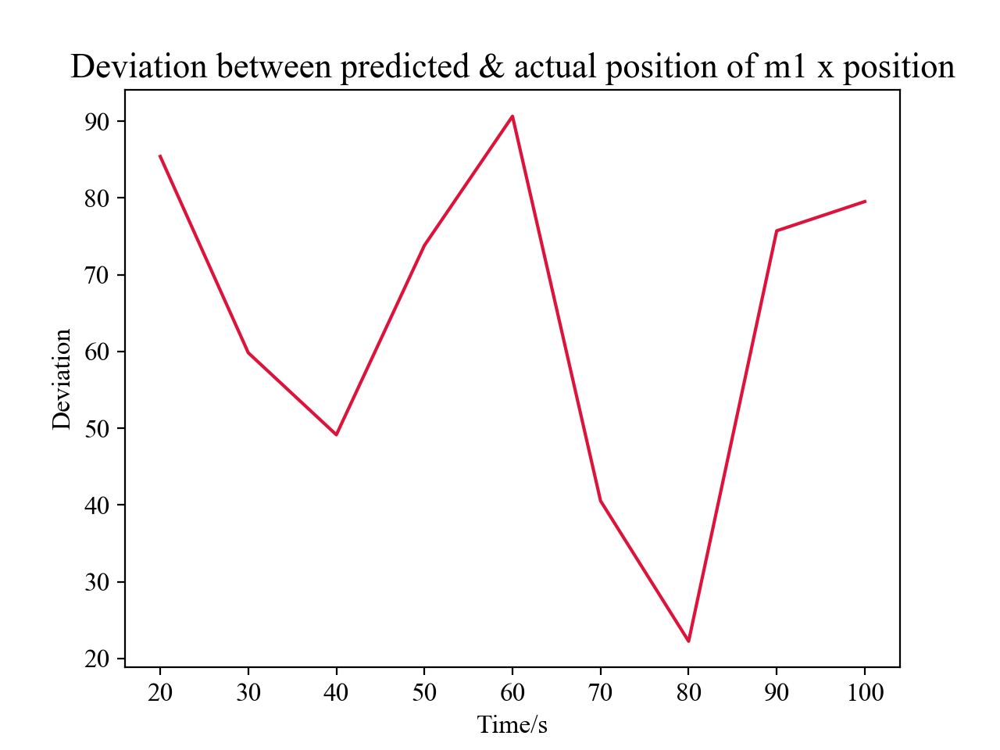

Text(0.5, 1.0, 'Deviation between predicted & actual position of m1 x position')

In [20]:
plt.figure(8)

plt.plot(new_steps, devx1, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m1 x position')

<IPython.core.display.Javascript object>


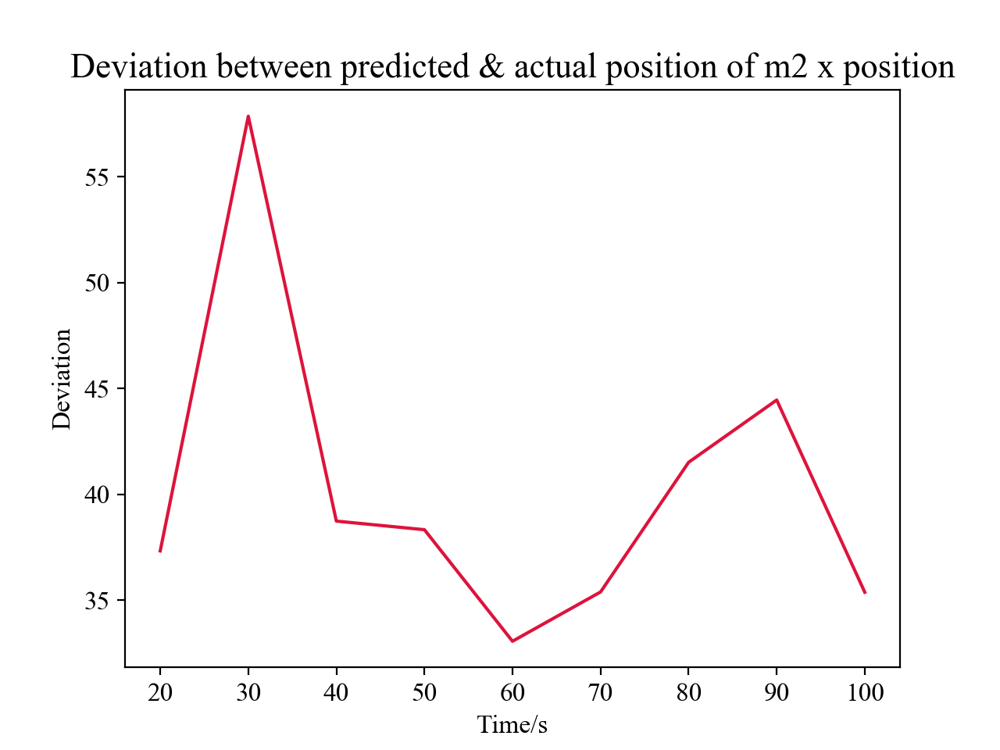

Text(0.5, 1.0, 'Deviation between predicted & actual position of m2 x position')

In [21]:
plt.figure(9)

plt.plot(new_steps, devx2, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m2 x position')

<IPython.core.display.Javascript object>


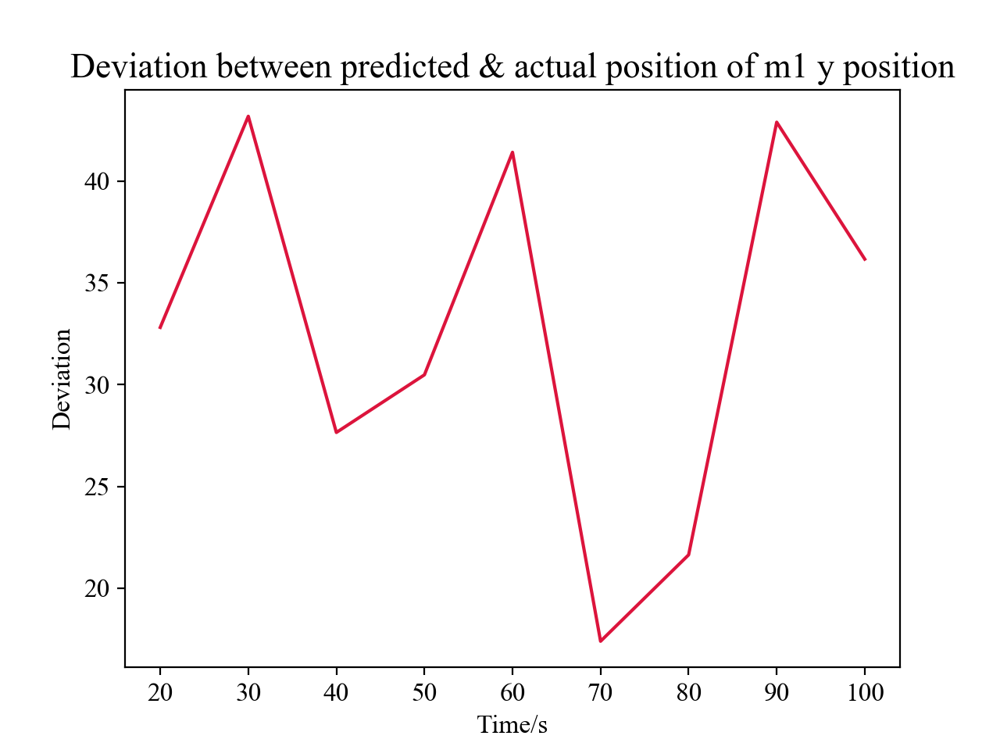

Text(0.5, 1.0, 'Deviation between predicted & actual position of m1 y position')

In [22]:
plt.figure(10)

plt.plot(new_steps, devy1, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m1 y position')

<IPython.core.display.Javascript object>


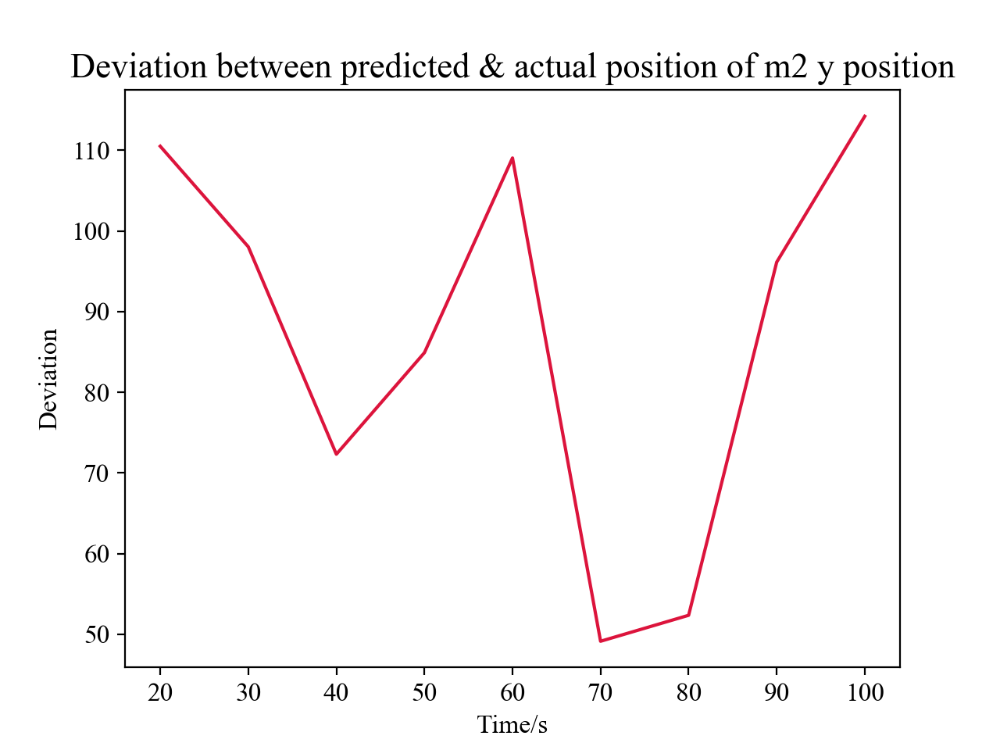

Text(0.5, 1.0, 'Deviation between predicted & actual position of m2 y position')

In [23]:
plt.figure(11)

plt.plot(new_steps, devy2, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m2 y position')

### 4 Changing initial conditions to $z_0=[\frac{\pi}{2},0,\frac{\pi}{2},0]$

In [24]:
z0=[np.pi/2,0,np.pi/2,0]

In [25]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


<IPython.core.display.Javascript object>


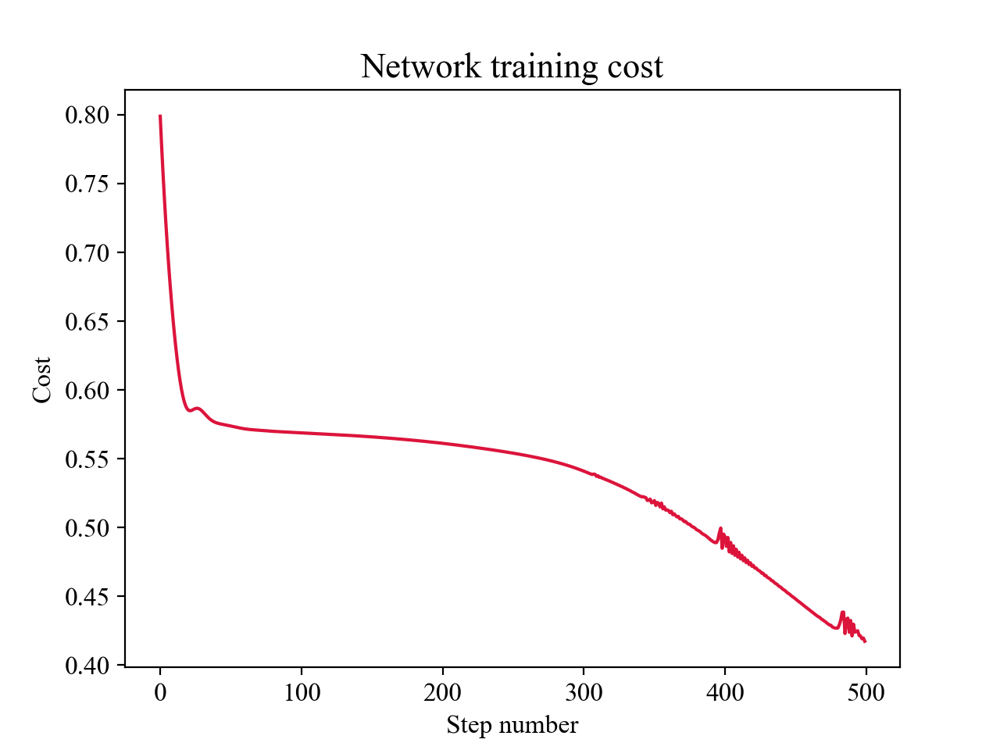

The final cost of the network is 0.4173603355884552


In [26]:
model = create_model()

steps = 500

cost = np.zeros(steps)

for i in range(steps):
    
    t = np.arange(0, tmax + dt, dt)
    
    Input, Return = target(t, windowsize, offset)
    
    cost[i] = model.train_on_batch(Input, Return)
    
plt.figure(12)

plt.plot(np.arange(steps), cost, color = 'crimson')

plt.title('Network training cost')
plt.xlabel('Step number')
plt.ylabel('Cost')

print('The final cost of the network is', cost[-1])

<IPython.core.display.Javascript object>


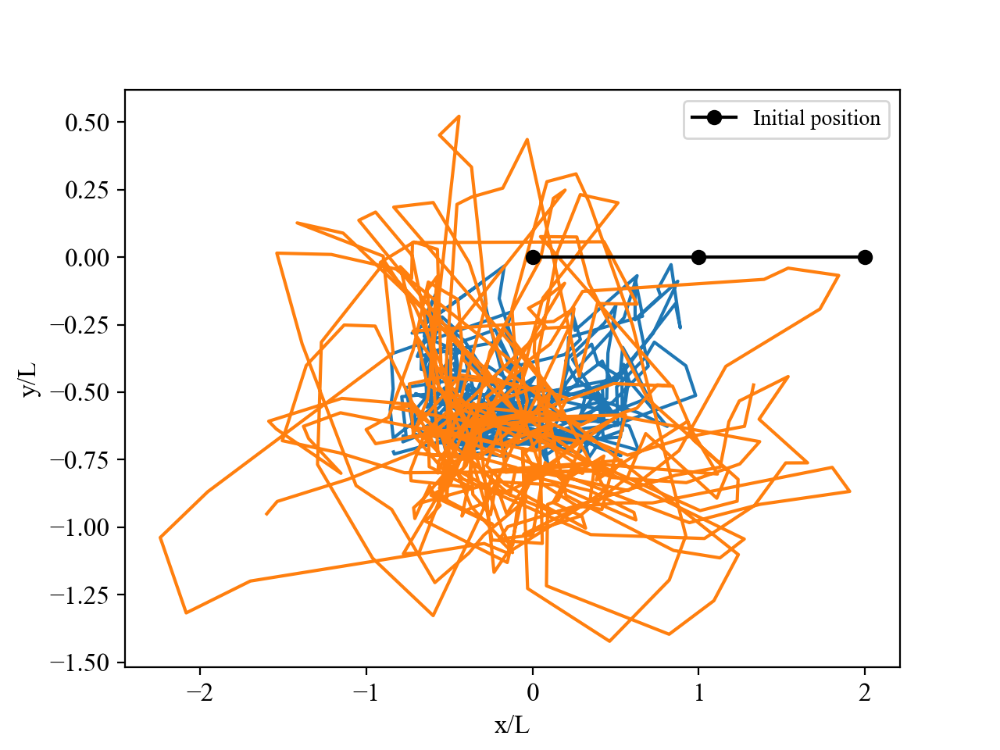

Text(0, 0.5, 'y/L')

In [27]:
t_test = np.arange(0, 50 + 0.1, 0.1)

Input, Return = target(t_test, windowsize, offset)

Input = Input.reshape(Input.shape[0], Input.shape[1], 4)

prediction = model.predict_on_batch(Input).reshape(4, len(t_test) + 1 - windowsize - offset)

x1_ret = prediction[0]
y1_ret = prediction[1]
x2_ret = prediction[2]
y2_ret = prediction[3]

plt.figure(13)

plt.plot(x1_ret, y1_ret)
plt.plot(x2_ret, y2_ret)
plt.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label = "Initial position", c = 'k')
plt.legend(loc='best')
plt.xlabel('x/L')
plt.ylabel('y/L')

In [28]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

solutions = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


<IPython.core.display.Javascript object>


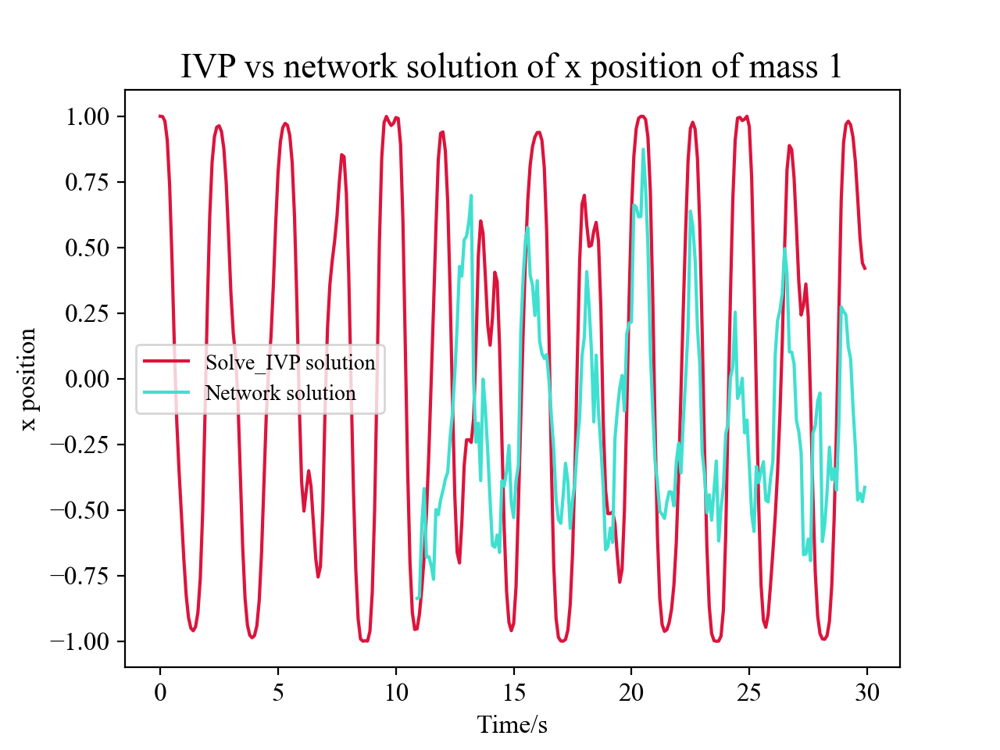

Text(0.5, 1.0, 'IVP vs network solution of x position of mass 1')

In [29]:
plt.figure(14)

plt.plot(t_test[:300], solutions[0][:300], color='crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[0][:300 - (windowsize + offset - 1)], 
         color ='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('x position')
plt.legend(loc='best')
plt.title('IVP vs network solution of x position of mass 1')

<IPython.core.display.Javascript object>


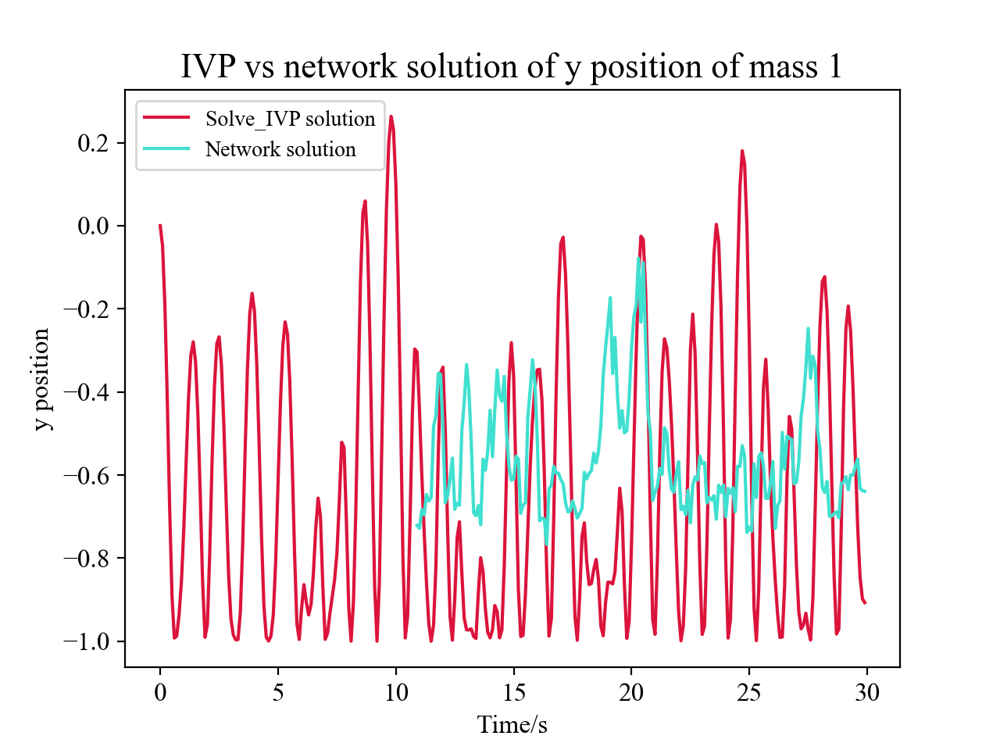

Text(0.5, 1.0, 'IVP vs network solution of y position of mass 1')

In [30]:
plt.figure(15)

plt.plot(t_test[:300], solutions[1][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[1][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('y position')
plt.legend(loc='best')
plt.title('IVP vs network solution of y position of mass 1')

<IPython.core.display.Javascript object>


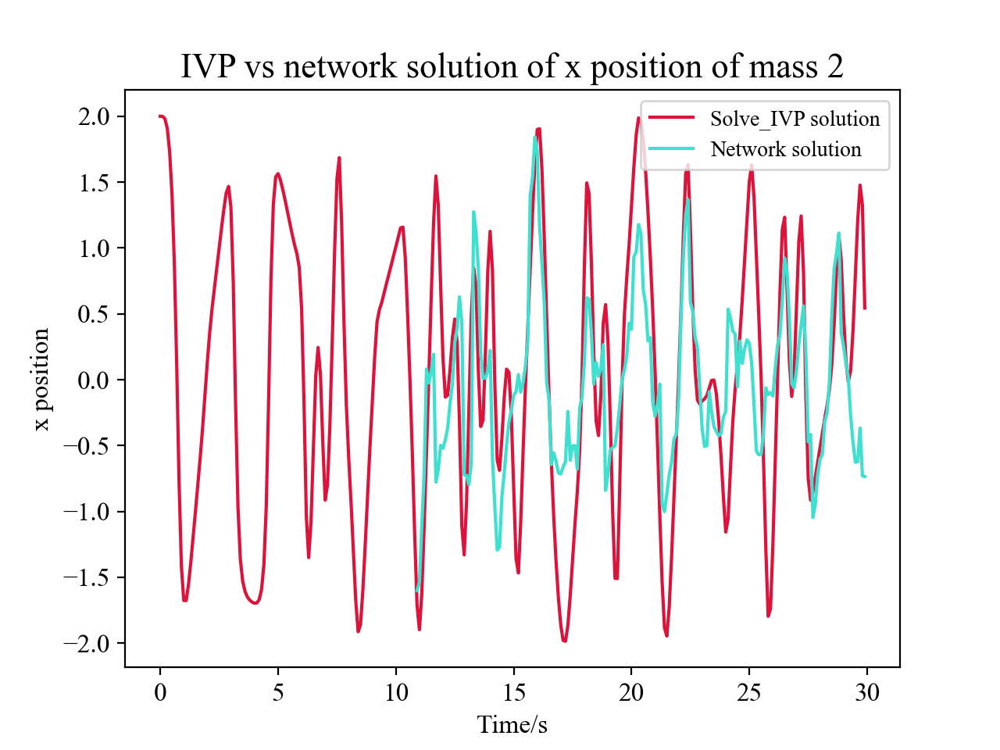

Text(0.5, 1.0, 'IVP vs network solution of x position of mass 2')

In [31]:
plt.figure(16)

plt.plot(t_test[:300], solutions[2][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[2][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('x position')
plt.legend(loc='best')
plt.title('IVP vs network solution of x position of mass 2')

<IPython.core.display.Javascript object>


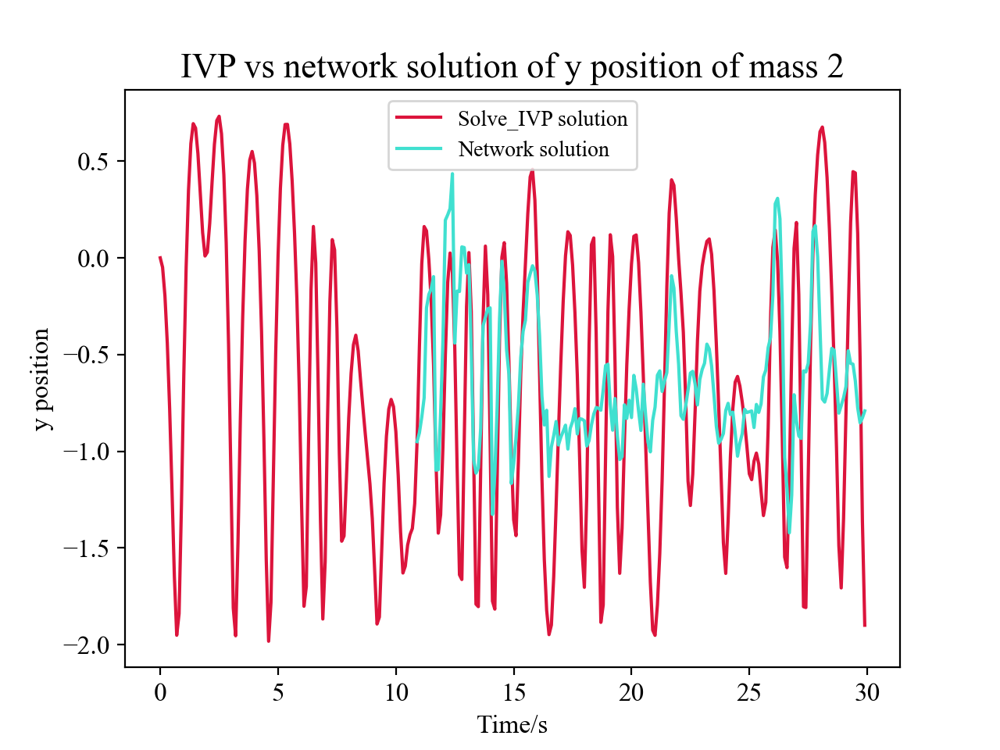

Text(0.5, 1.0, 'IVP vs network solution of y position of mass 2')

In [32]:
plt.figure(17)

plt.plot(t_test[:300], solutions[3][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[3][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('y position')
plt.legend(loc='best')
plt.title('IVP vs network solution of y position of mass 2')

Changing the initial conditions to $z_0=[\frac{\pi}{2},0,\frac{\pi}{2},0]$ drastically changes the motion of the double pendulum, as seen by the plot of the system, the motion is highly chaotic. This means that it is very hard for the neural network to accurtely predict positions of the masses, hence none of the 4 plots really show any kind of accurate network solution.

In [33]:
new_steps = np.arange(20, 100 + 10, 10)

devx1, devx2, devy1, devy2 = [], [], [], []

for steps in new_steps:
    
    offset = steps
    
    model = create_model()
    
    steps = 300
    
    for i in range(steps):
        
        Input, Return = target(t, windowsize, offset)
        
        model.train_on_batch(Input, Return)
        
    devx1.append(deviation(t, windowsize, offset, model)[0])
    devy1.append(deviation(t, windowsize, offset, model)[1])
    devx2.append(deviation(t, windowsize, offset, model)[2])
    devy2.append(deviation(t, windowsize, offset, model)[3])

<IPython.core.display.Javascript object>


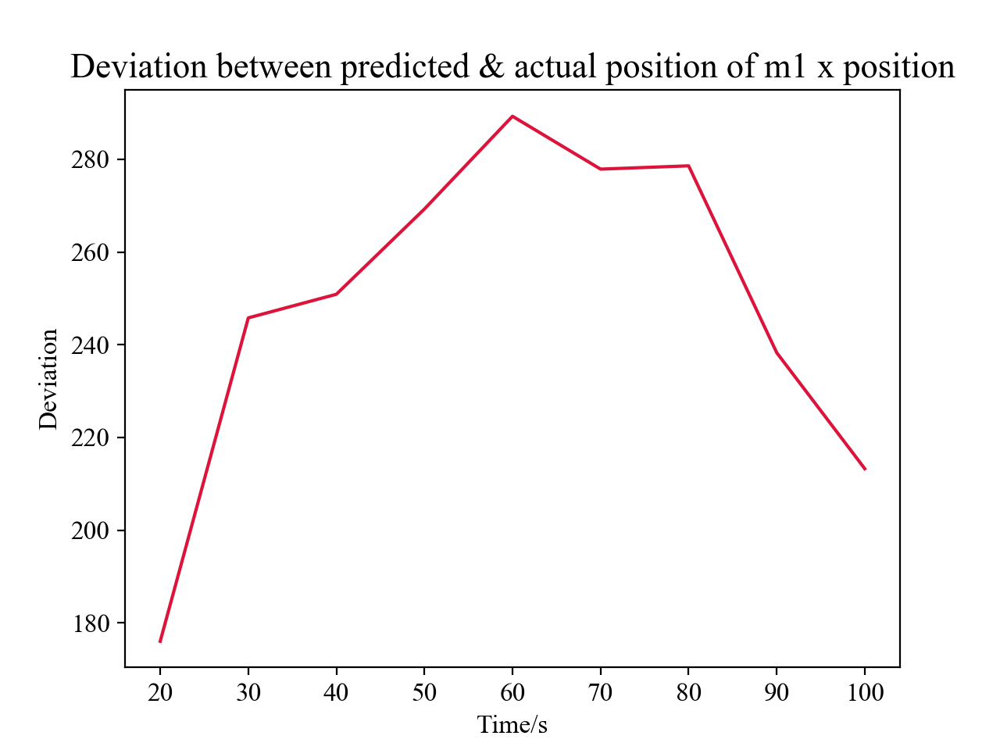

Text(0.5, 1.0, 'Deviation between predicted & actual position of m1 x position')

In [34]:
plt.figure(18)

plt.plot(new_steps, devx1, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m1 x position')

<IPython.core.display.Javascript object>


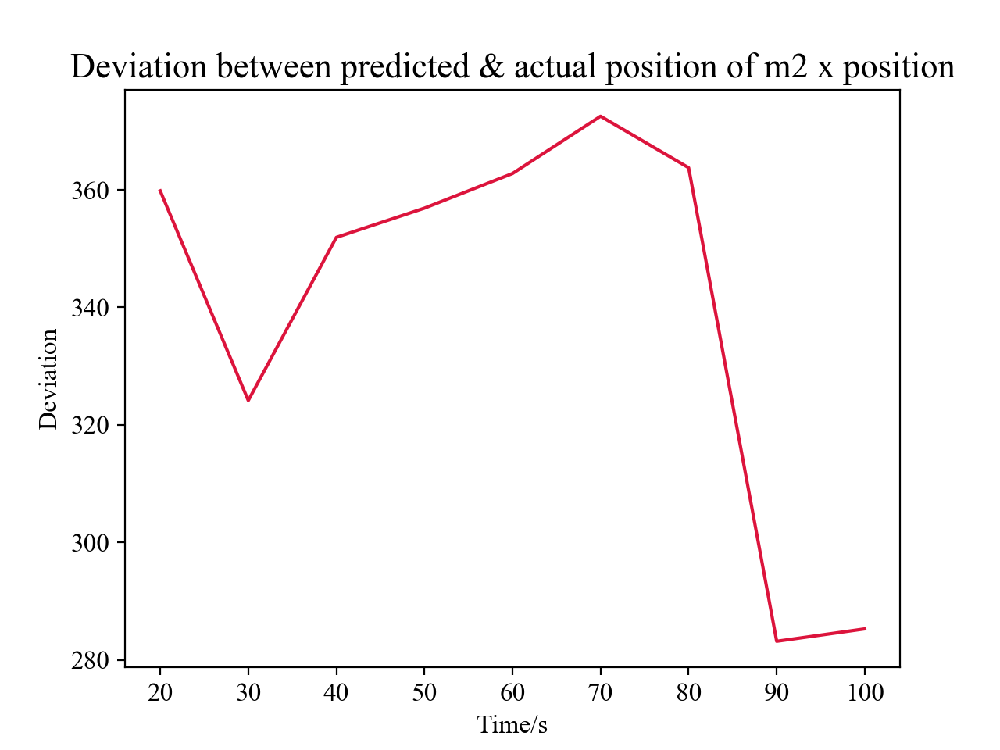

Text(0.5, 1.0, 'Deviation between predicted & actual position of m2 x position')

In [35]:
plt.figure(19)

plt.plot(new_steps, devx2, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m2 x position')

<IPython.core.display.Javascript object>


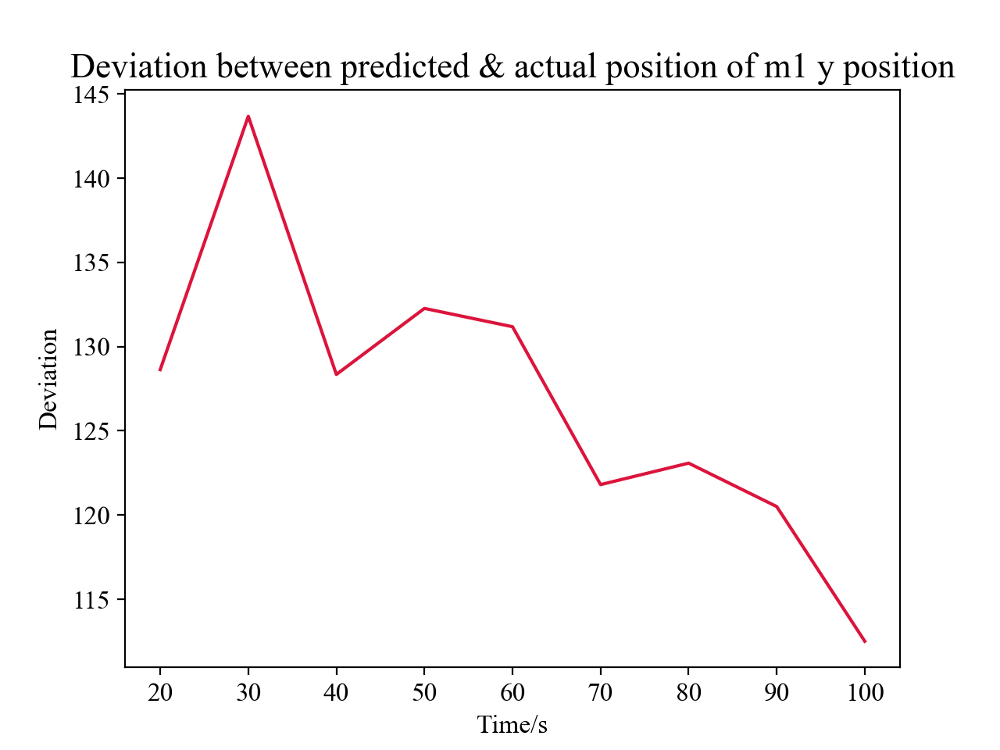

Text(0.5, 1.0, 'Deviation between predicted & actual position of m1 y position')

In [36]:
plt.figure(20)

plt.plot(new_steps, devy1, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m1 y position')

/var/folders/7z/rmch61js7g9cp6pw555cl3tm0000gn/T/ipykernel_50677/2093759348.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(21)


<IPython.core.display.Javascript object>


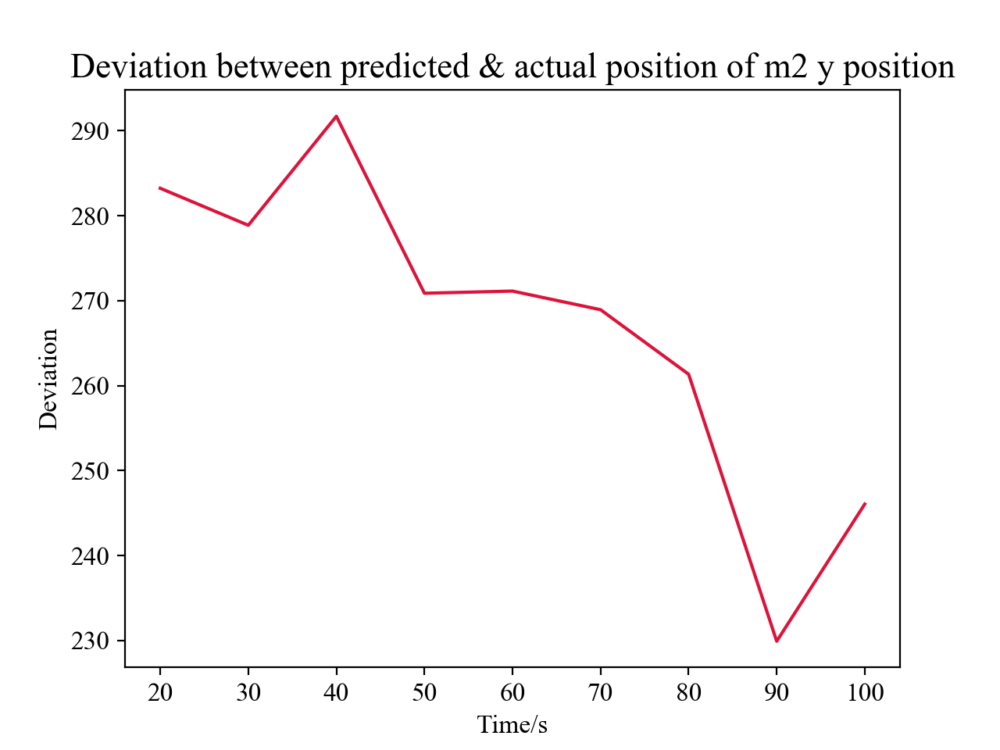

Text(0.5, 1.0, 'Deviation between predicted & actual position of m2 y position')

In [37]:
plt.figure(21)

plt.plot(new_steps, devy2, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m2 y position')

The deviations are huge compared to when the initial conditions were $z_0=[\frac{\pi}{4},0,\frac{\pi}{4},0]$, owing to the chaotic nature and difficulty the network finds in prediciting the positions accuratly, since there is no clear pattern.

### 5 Training only on positions of $m_2$

In [38]:
def create_model():

    model = keras.models.Sequential()

    #Now the input shape is None, 2 because only 2 inputs are required, the x and y position of mass 2
    model.add(keras.layers.LSTM(40, input_shape = (None, 2), return_sequences = False))

    model.add(keras.layers.Dense(4, activation = 'linear'))

    model.compile(loss = 'mean_squared_error', optimizer = 'adam')
    
    return model

### 5.1 Initial conditions $z_0=[\frac{\pi}{4},0,\frac{\pi}{4},0]$

<IPython.core.display.Javascript object>


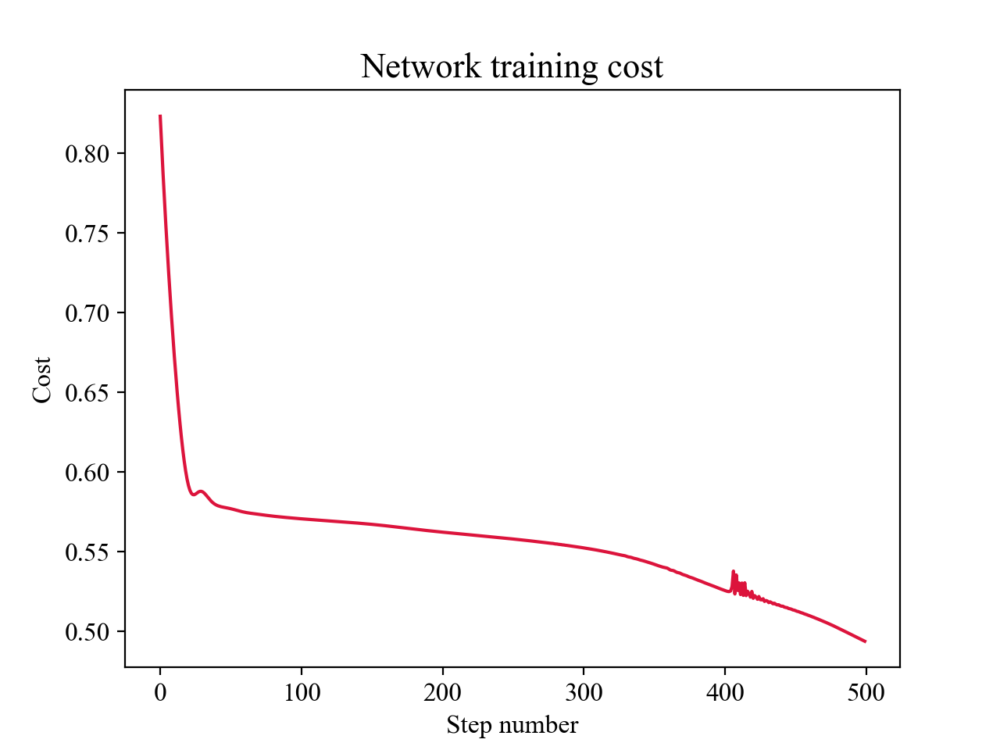

The final cost of the network is 0.4938873052597046


In [39]:
z0 = [np.pi/4, 0, np.pi/4, 0]

model = create_model()

steps = 500

cost = np.zeros(steps)

for i in range(steps):
    
    t = np.arange(0, tmax + dt, dt)
    
    Input, Return = target(t, windowsize, offset)
    
    Input = Input[:,:,2:]
    
    Return = Return[:,:]
    
    cost[i] = model.train_on_batch(Input, Return)
    
plt.figure(22)

plt.plot(np.arange(steps), cost, color = 'crimson',)

plt.title('Network training cost')
plt.xlabel('Step number')
plt.ylabel('Cost')

print('The final cost of the network is', cost[-1])

In [40]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

solutions = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


<IPython.core.display.Javascript object>


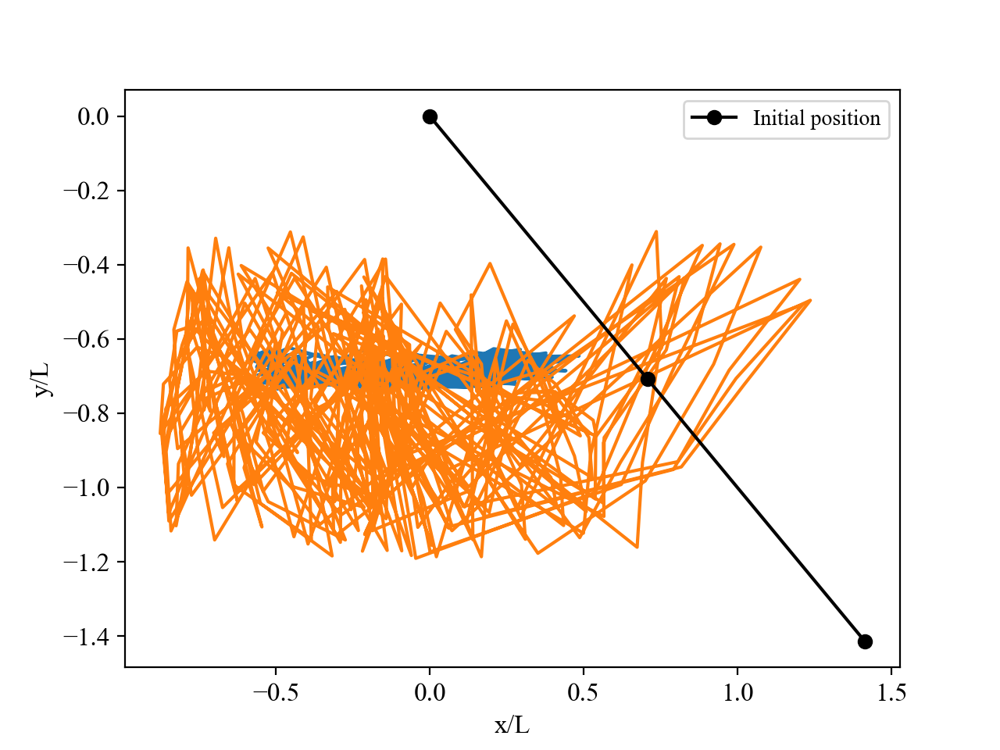

Text(0, 0.5, 'y/L')

In [41]:
t_test = np.arange(0, 50 + 0.1, 0.1)

Input, Return = target(t_test, windowsize, offset)

Input = Input[:,:,2:]

prediction = model.predict_on_batch(Input).reshape(4, len(t_test) + 1 - windowsize - offset)

x1_ret = prediction[0]
y1_ret = prediction[1]
x2_ret = prediction[2]
y2_ret = prediction[3]

plt.figure(23)

plt.plot(x1_ret, y1_ret)
plt.plot(x2_ret, y2_ret)
plt.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label = "Initial position", c = 'k')
plt.legend(loc='best')
plt.xlabel('x/L')
plt.ylabel('y/L')

In [42]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

solutions = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


<IPython.core.display.Javascript object>


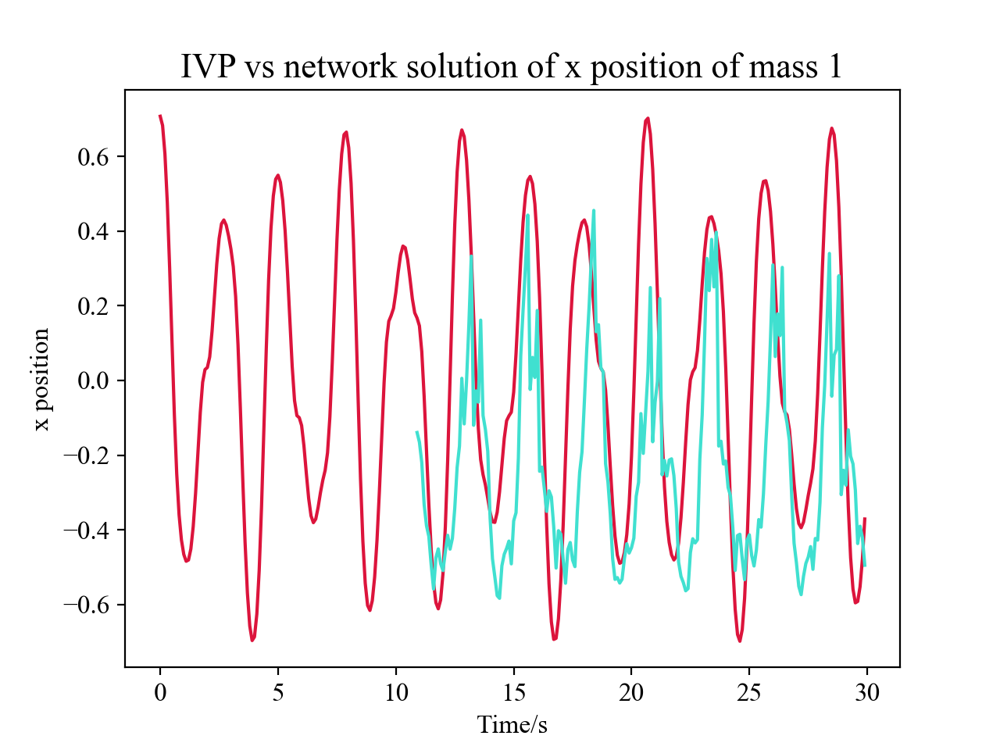

Text(0.5, 1.0, 'IVP vs network solution of x position of mass 1')

In [43]:
plt.figure(24)

plt.plot(t_test[:300], solutions[0][:300], color='crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[0][:300 - (windowsize + offset - 1)], 
         color ='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('x position')
plt.title('IVP vs network solution of x position of mass 1')

<IPython.core.display.Javascript object>


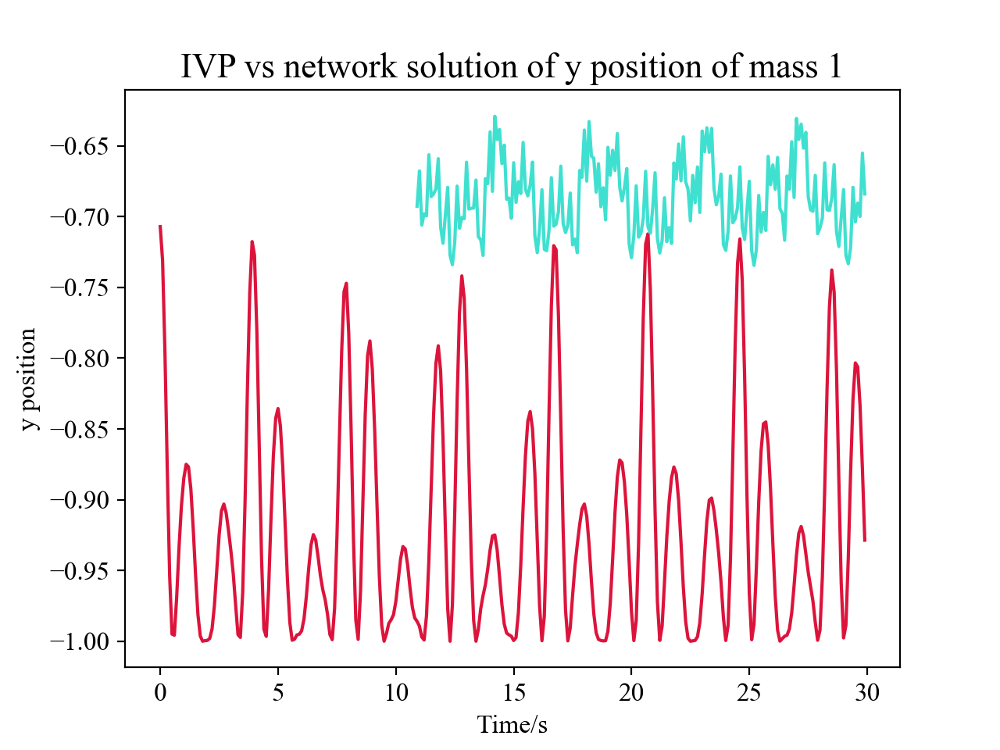

Text(0.5, 1.0, 'IVP vs network solution of y position of mass 1')

In [44]:
plt.figure(25)

plt.plot(t_test[:300], solutions[1][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[1][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('y position')
plt.title('IVP vs network solution of y position of mass 1')

<IPython.core.display.Javascript object>


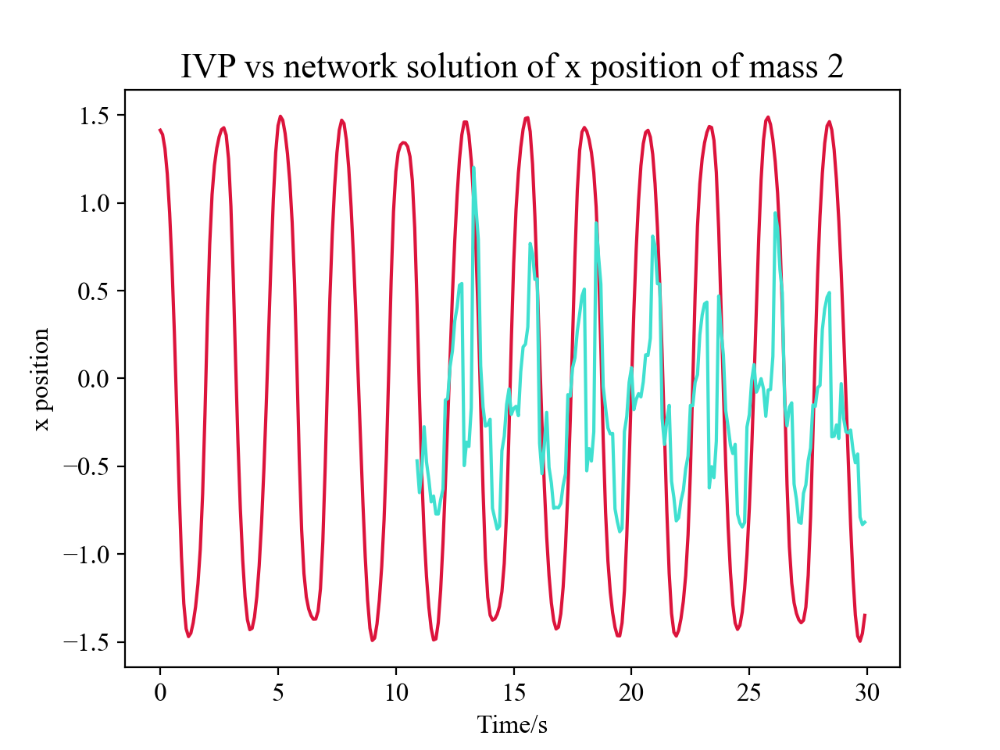

Text(0.5, 1.0, 'IVP vs network solution of x position of mass 2')

In [45]:
plt.figure(26)

plt.plot(t_test[:300], solutions[2][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[2][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('x position')
plt.title('IVP vs network solution of x position of mass 2')

<IPython.core.display.Javascript object>


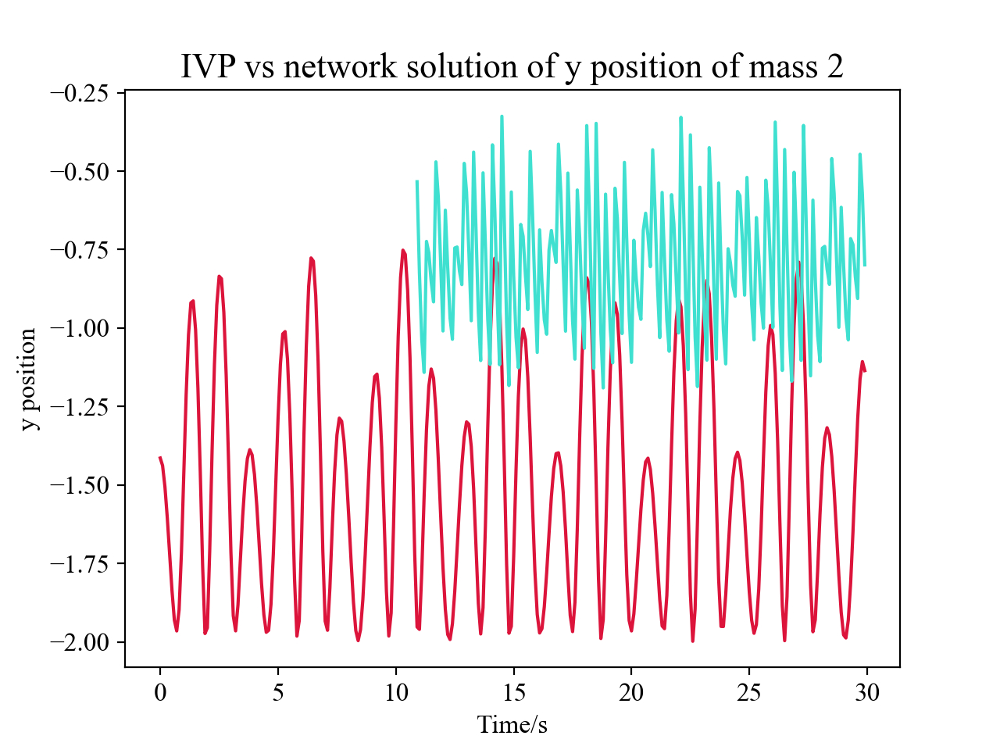

Text(0.5, 1.0, 'IVP vs network solution of y position of mass 2')

In [46]:
plt.figure(27)

plt.plot(t_test[:300], solutions[3][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[3][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('y position')
plt.title('IVP vs network solution of y position of mass 2')

The network is good at prediciting the x positions of both masses, but struggles with predicting the y positions.

In [47]:
def deviation(t, windowsize, offset, model):
        
    prediction = model.predict_on_batch(Input).reshape(4, len(t) + 1 - windowsize - offset)
    
    # Solve initial value problem
    ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
    z=ret.y

    # Extract result
    theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
    positions = to_cartesian(theta1, w1, theta2, w2, L1, L2)
    
    dev = []
    
    for i in range(4):
        
        dev.append(np.sum(np.abs(prediction[i] - positions[i][windowsize + offset - 1:])))
        
    return dev

In [48]:
new_steps = np.arange(20, 100 + 10, 10)

devx1, devx2, devy1, devy2 = [], [], [], []

for steps in new_steps:
    
    offset = steps
    
    model = create_model()
    
    steps = 300
    
    for i in range(steps):
        
        Input, Return = target(t, windowsize, offset)
        
        Input = Input[:,:,2:]
        
        Return = Return[:,:]
        
        model.train_on_batch(Input, Return)
        
    devx1.append(deviation(t, windowsize, offset, model)[0])
    devy1.append(deviation(t, windowsize, offset, model)[1])
    devx2.append(deviation(t, windowsize, offset, model)[2])
    devy2.append(deviation(t, windowsize, offset, model)[3])

In [49]:
plt.figure(28)

plt.plot(new_steps, devx1, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m1 x position')

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Deviation between predicted & actual position of m1 x position')

<IPython.core.display.Javascript object>


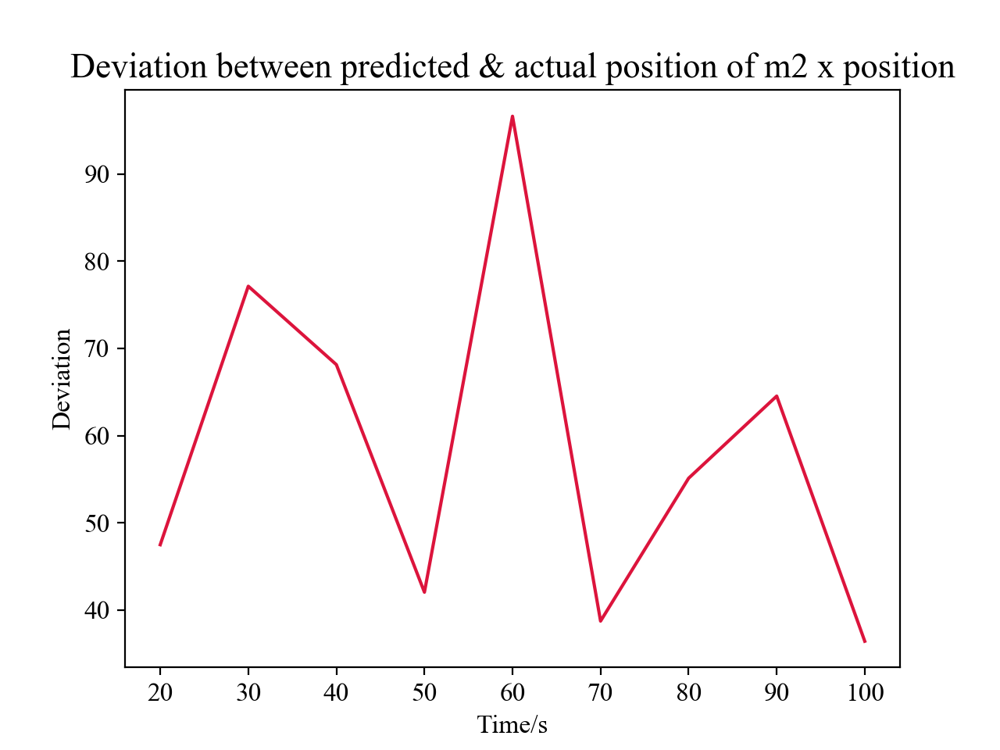

Text(0.5, 1.0, 'Deviation between predicted & actual position of m2 x position')

In [50]:
plt.figure(29)

plt.plot(new_steps, devx2, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m2 x position')

<IPython.core.display.Javascript object>


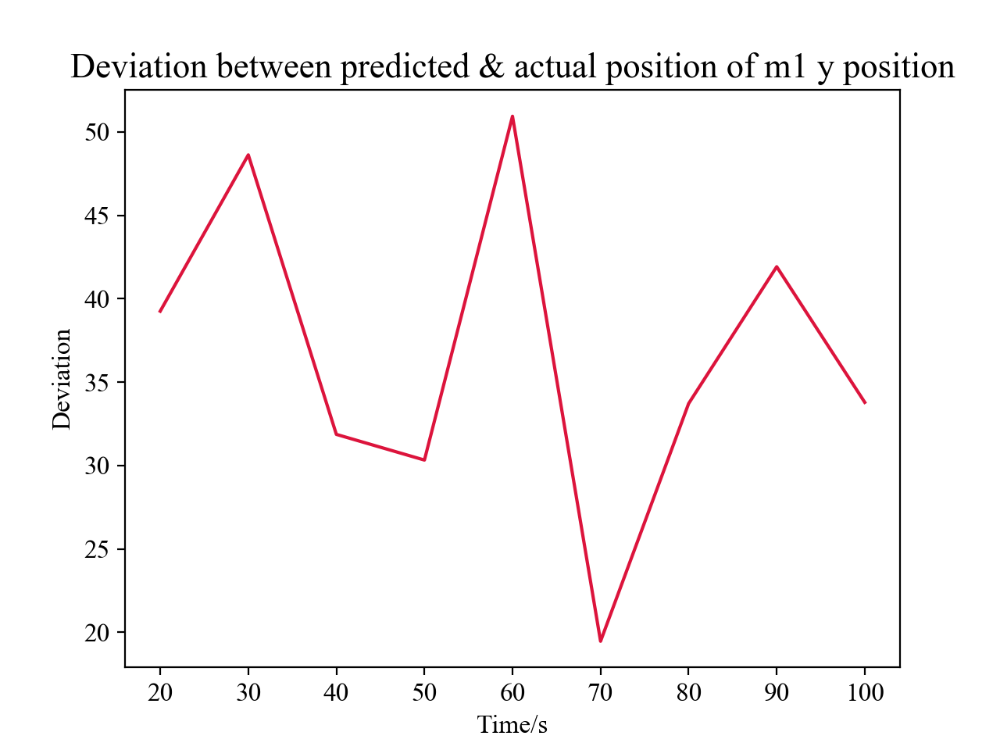

Text(0.5, 1.0, 'Deviation between predicted & actual position of m1 y position')

In [51]:
plt.figure(30)

plt.plot(new_steps, devy1, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m1 y position')

<IPython.core.display.Javascript object>


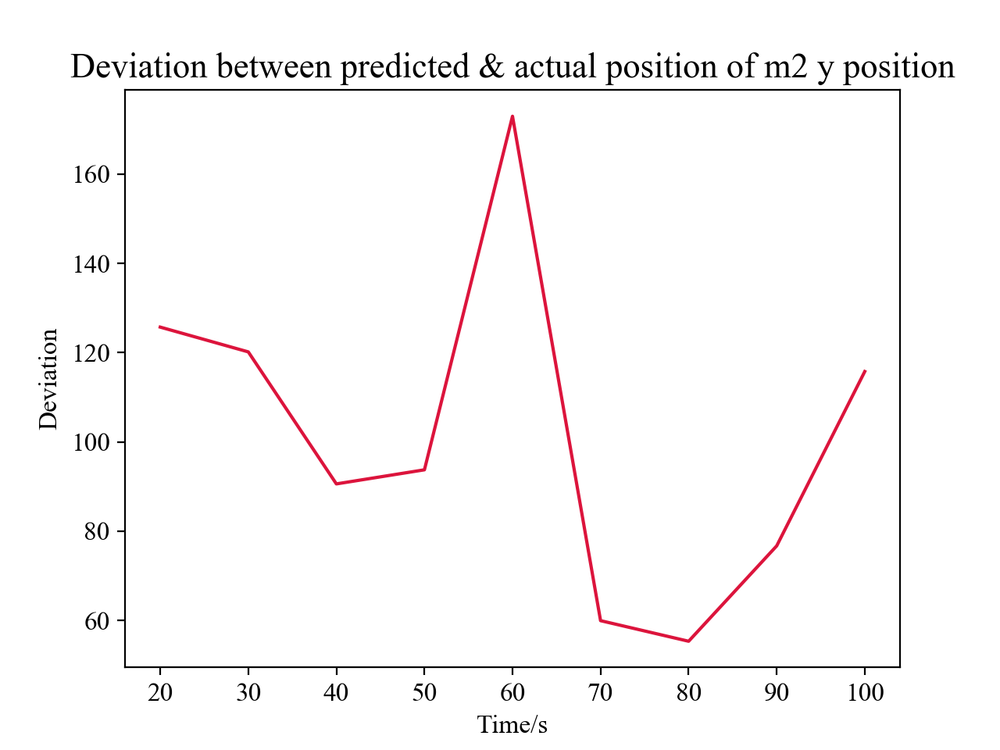

Text(0.5, 1.0, 'Deviation between predicted & actual position of m2 y position')

In [52]:
plt.figure(31)

plt.plot(new_steps, devy2, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m2 y position')

### 5.2 Training only on position of $m_2$ and $z_{0} = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$

<IPython.core.display.Javascript object>


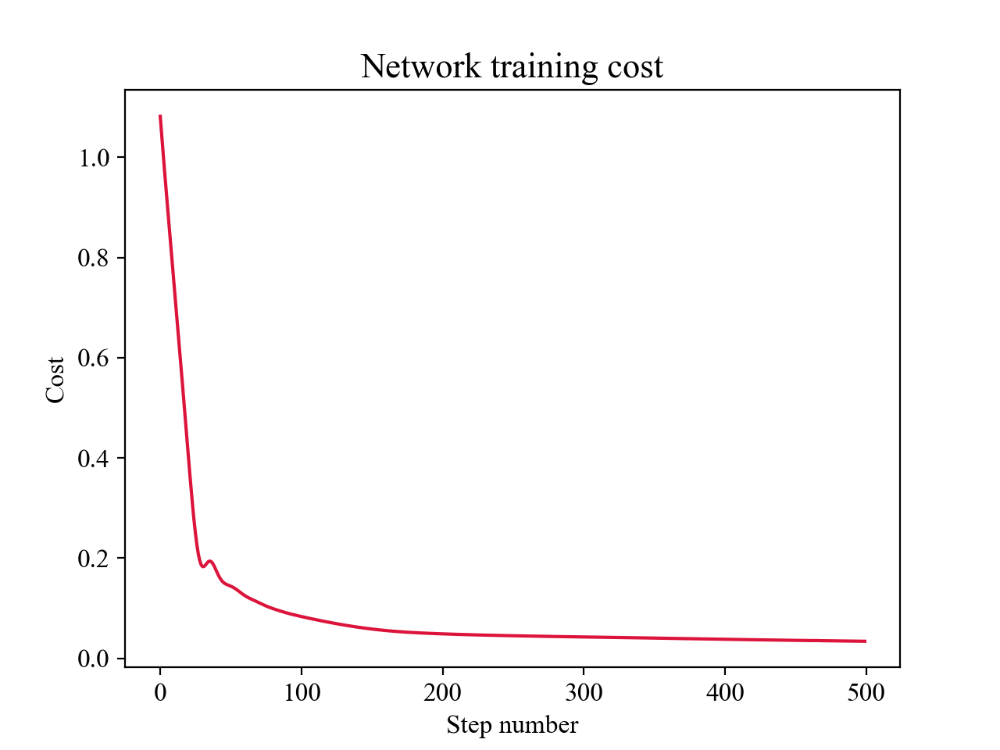

The final cost of the network is 0.03426942974328995


In [53]:
z0 = [np.pi/2, 0, np.pi/2, 0]

model = create_model()

steps = 500

cost = np.zeros(steps)

for i in range(steps):
    
    t = np.arange(0, tmax + dt, dt)
    
    Input, Return = target(t, windowsize, offset)
    
    Input = Input[:,:,2:]
    
    Return = Return[:,:]
    
    cost[i] = model.train_on_batch(Input, Return)
    
plt.figure(32)

plt.plot(np.arange(steps), cost, color = 'crimson',)

plt.title('Network training cost')
plt.xlabel('Step number')
plt.ylabel('Cost')

print('The final cost of the network is', cost[-1])

In [54]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

solutions = to_cartesian(theta1, w1, theta2, w2, L1, L2)

<IPython.core.display.Javascript object>


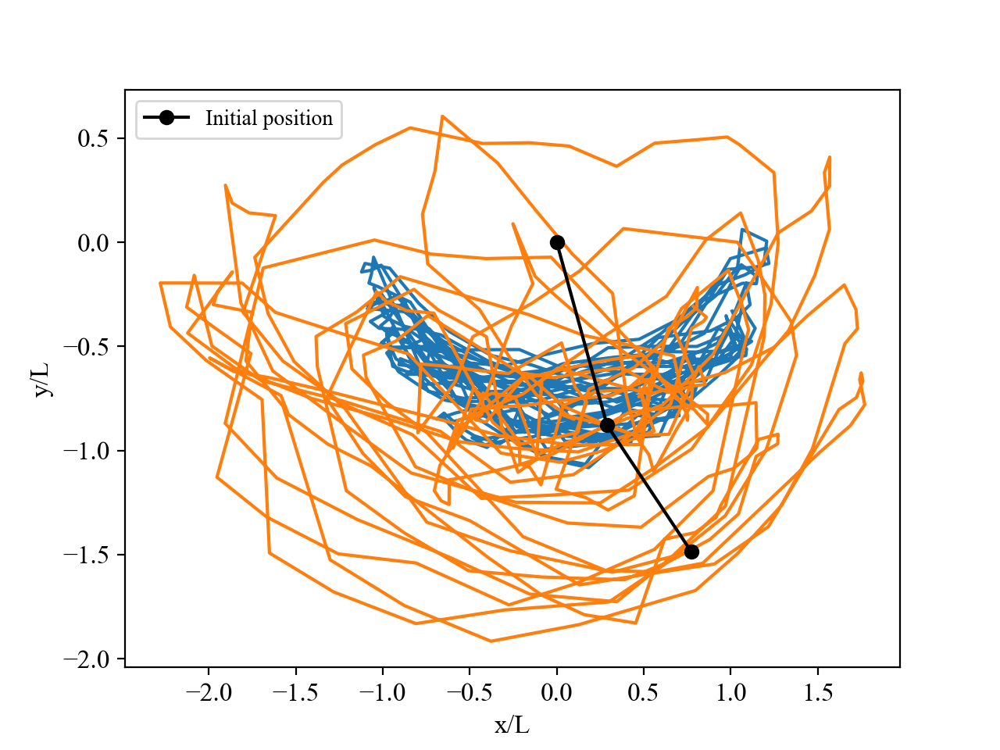

Text(0, 0.5, 'y/L')

In [55]:
t_test = np.arange(0, 50 + 0.1, 0.1)

Input, Return = target(t_test, windowsize, offset)

Input = Input[:,:,2:]

prediction = model.predict_on_batch(Input).reshape(4, len(t_test) + 1 - windowsize - offset)

x1_ret = prediction[0]
y1_ret = prediction[1]
x2_ret = prediction[2]
y2_ret = prediction[3]

plt.figure(33)

plt.plot(x1_ret, y1_ret)
plt.plot(x2_ret, y2_ret)
plt.plot([0, x1_ret[0], x2_ret[0]], [0, y1_ret[0], y2_ret[0]], "-o", label = "Initial position", c = 'k')
plt.legend(loc='best')
plt.xlabel('x/L')
plt.ylabel('y/L')

In [56]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

solutions = to_cartesian(theta1, w1, theta2, w2, L1, L2)

<IPython.core.display.Javascript object>


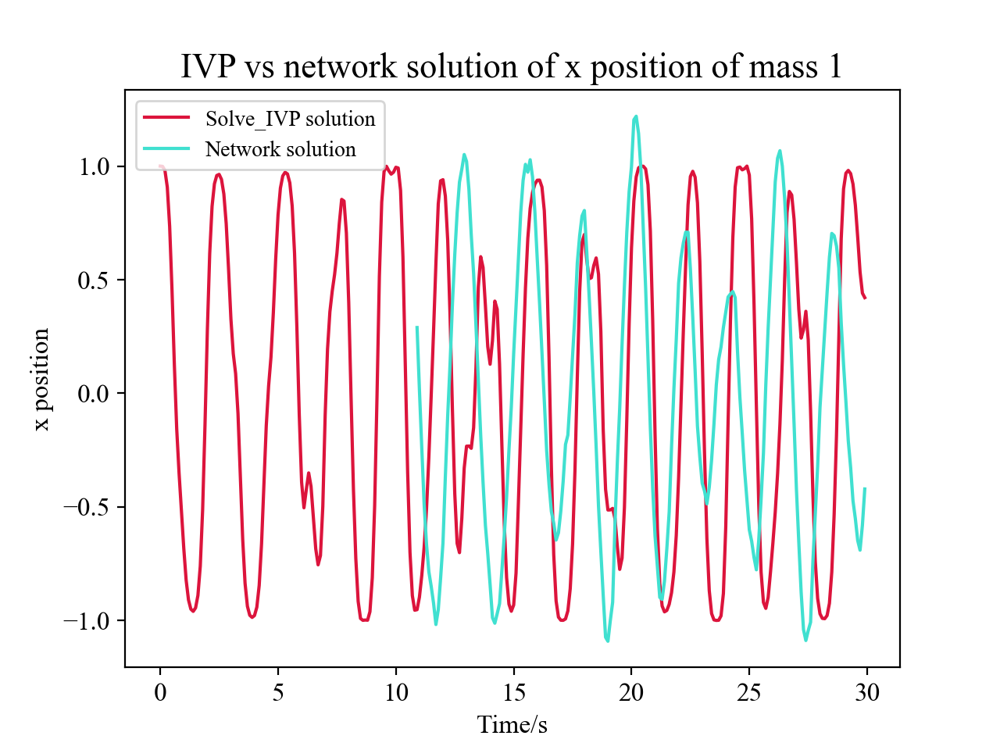

Text(0.5, 1.0, 'IVP vs network solution of x position of mass 1')

In [57]:
plt.figure(34)

plt.plot(t_test[:300], solutions[0][:300], color='crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[0][:300 - (windowsize + offset - 1)], 
         color ='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('x position')
plt.legend(loc='best')
plt.title('IVP vs network solution of x position of mass 1')

<IPython.core.display.Javascript object>


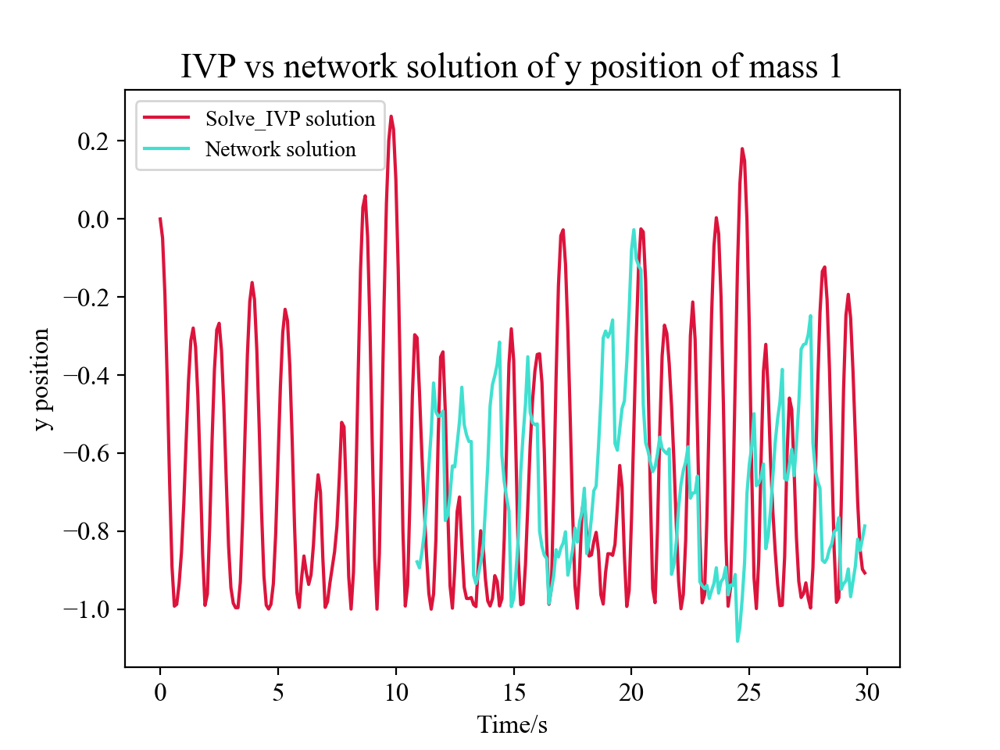

Text(0.5, 1.0, 'IVP vs network solution of y position of mass 1')

In [58]:
plt.figure(35)

plt.plot(t_test[:300], solutions[1][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[1][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('y position')
plt.legend(loc='best')
plt.title('IVP vs network solution of y position of mass 1')

In [59]:
plt.figure(36)

plt.plot(t_test[:300], solutions[2][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[2][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('x position')
plt.legend(loc='best')
plt.title('IVP vs network solution of x position of mass 2')

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'IVP vs network solution of x position of mass 2')

<IPython.core.display.Javascript object>


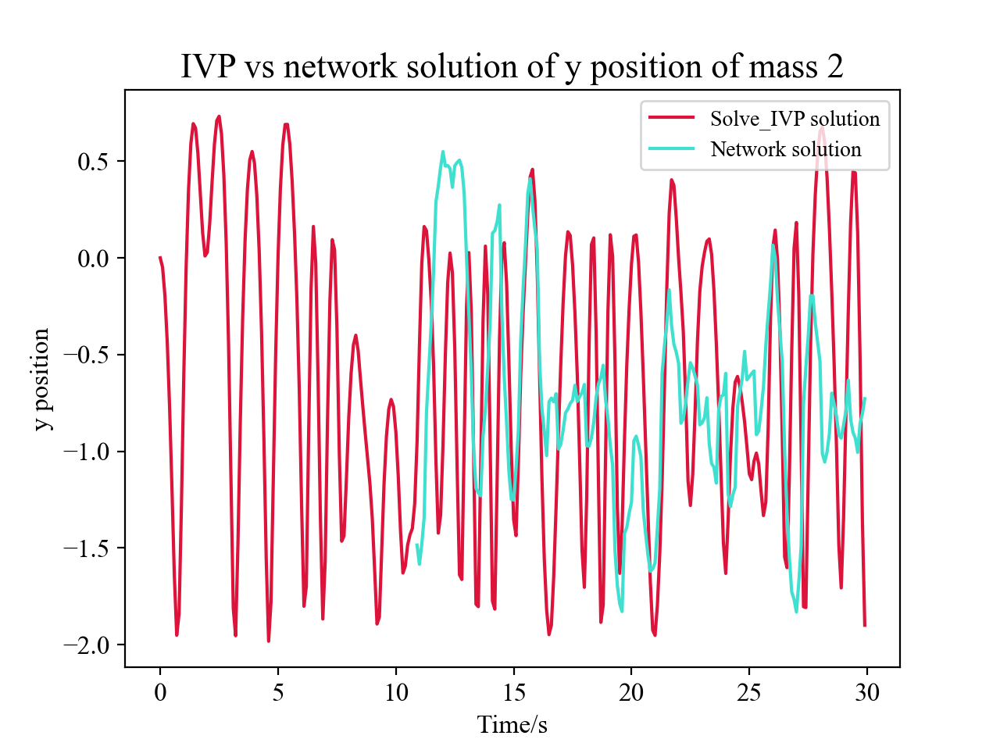

Text(0.5, 1.0, 'IVP vs network solution of y position of mass 2')

In [60]:
plt.figure(37)

plt.plot(t_test[:300], solutions[3][:300], color = 'crimson', label = 'Solve_IVP solution')
plt.plot(t_test[windowsize + offset - 1:300], prediction[3][:300 - (windowsize + offset - 1)],
        color='turquoise', label = 'Network solution')
plt.xlabel('Time/s')
plt.ylabel('y position')
plt.legend(loc='best')
plt.title('IVP vs network solution of y position of mass 2')

In [61]:
new_steps = np.arange(20, 100 + 10, 10)

devx1, devx2, devy1, devy2 = [], [], [], []

for steps in new_steps:
    
    offset = steps
    
    model = create_model()
    
    steps = 300
    
    for i in range(steps):
        
        Input, Return = target(t, windowsize, offset)
        
        Input = Input[:,:,2:]
        
        Return = Return[:,:]
        
        model.train_on_batch(Input, Return)
        
    devx1.append(deviation(t, windowsize, offset, model)[0])
    devy1.append(deviation(t, windowsize, offset, model)[1])
    devx2.append(deviation(t, windowsize, offset, model)[2])
    devy2.append(deviation(t, windowsize, offset, model)[3])

<IPython.core.display.Javascript object>


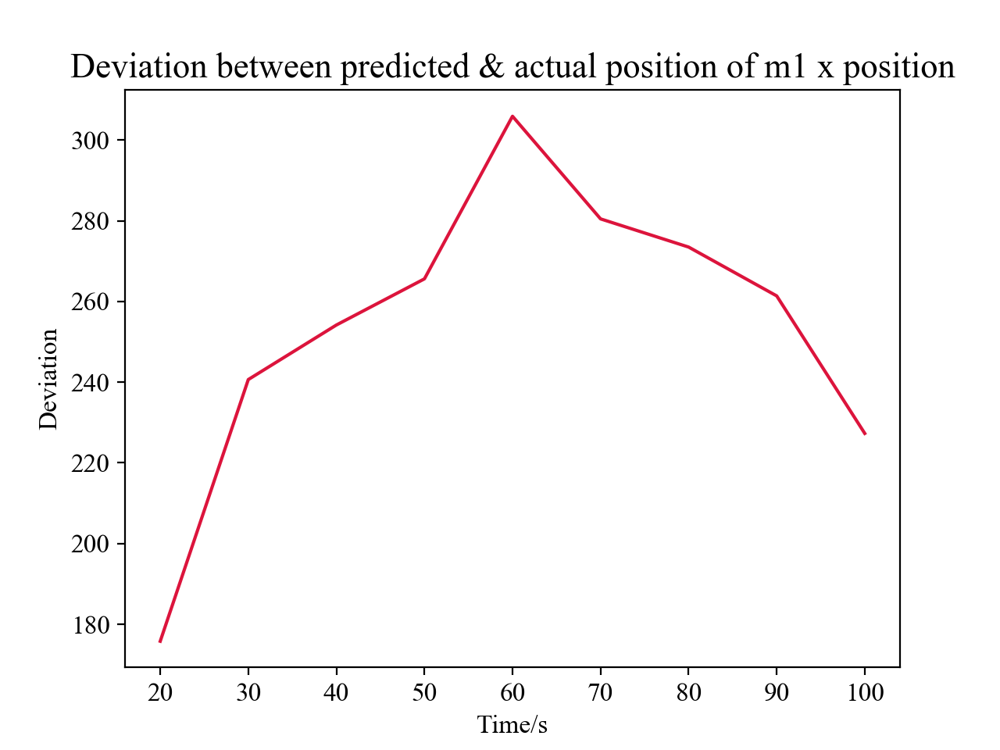

Text(0.5, 1.0, 'Deviation between predicted & actual position of m1 x position')

In [62]:
plt.figure(38)

plt.plot(new_steps, devx1, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m1 x position')

<IPython.core.display.Javascript object>


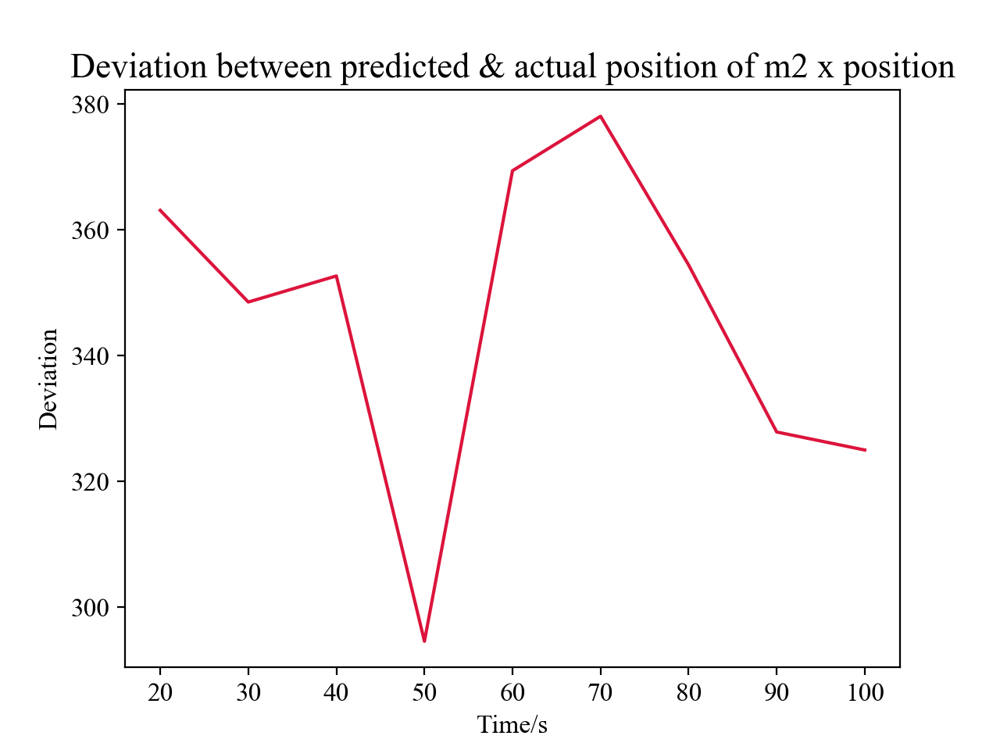

Text(0.5, 1.0, 'Deviation between predicted & actual position of m2 x position')

In [63]:
plt.figure(39)

plt.plot(new_steps, devx2, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m2 x position')

<IPython.core.display.Javascript object>


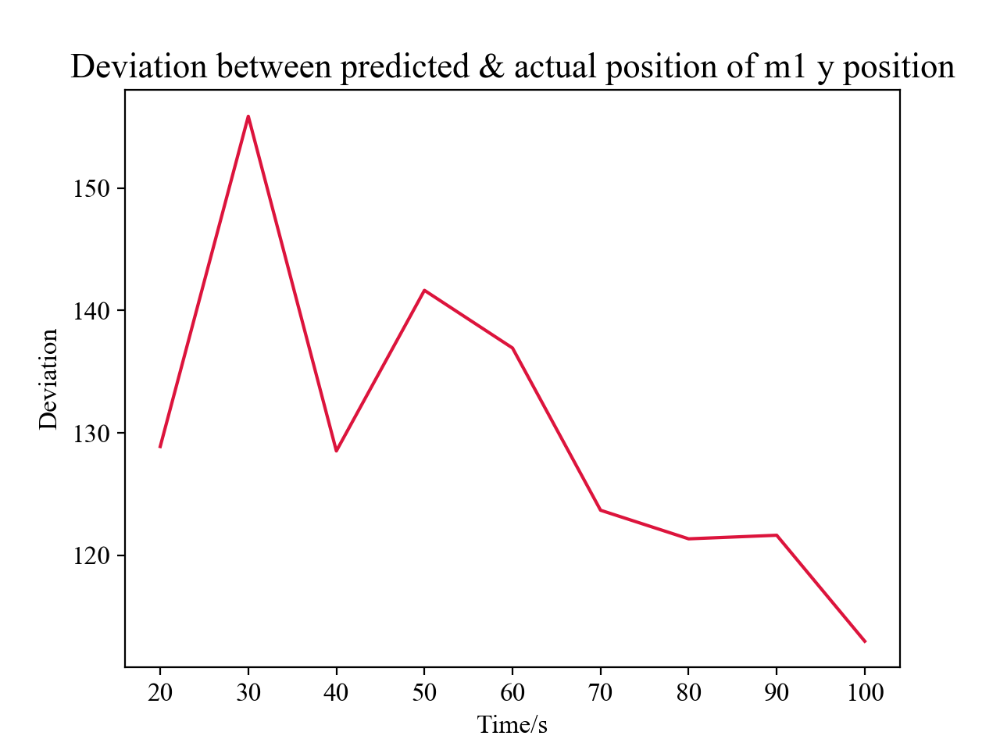

Text(0.5, 1.0, 'Deviation between predicted & actual position of m1 y position')

In [64]:
plt.figure(40)

plt.plot(new_steps, devy1, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m1 y position')

In [65]:
plt.figure(41)

plt.plot(new_steps, devy2, color='crimson')
plt.xlabel('Time/s')
plt.ylabel('Deviation')
plt.title('Deviation between predicted & actual position of m2 y position')

<IPython.core.display.Javascript object>

Text(0.5, 1.0, 'Deviation between predicted & actual position of m2 y position')

As we can see, for the case when the initial conditions are $z_{0} = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$, the network is much better at prediciting than when the initial conditions are $z_{0} = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$. This is because for the latter case, the motion is highly chaotic and the LSTM model can't predict that well with the windowsize given because there is no clear pattern in the motion, as opposed to the former case. By making the time steps very much smaller, the network will be better at predicting as the motion will become less chaotic.